In [1]:
from LFC.Hardware.TDS2024C import TDS2024C
osc = TDS2024C()
osc.connect()
from LFC.Hardware.AndoOSA_AQ6315E import AndoOSA_AQ6315E
osa = AndoOSA_AQ6315E()
osa.connect()
from LFC.KeckLFC import KeckLFC
lfc = KeckLFC(amamp_addr = 'ASRL13::INSTR', amamp_name = 'Amonic 23dbm EDFA',#'Amonic 6A 680mW EDFA',
              ptamp_addr = 'ASRL6::INSTR', ptamp_name = 'Pritel 3.85A 3.6W FA',
              RFoscPS_addr = 'ASRL5::INSTR', RFoscPS_name = 'RF oscillator Power Supply 15V 0.4A',
              RFampPS_addr = 'ASRL10::INSTR', RFampPS_name = 'RF amplifier Power Supply 30V 4.5A',
              rbclock_addr = 'ASRL9::INSTR', rbclock_name = 'FS725 Rubidium Frequency Standard')

lfc.connect_all()

TDS2024C OSC connected
ANDO AQ-6315E Optical Spectrum Analyzer connected
Amonic 23dbm EDFA connected
Amonic 13dbm EDFA connected
Pritel 3.85A 3.6W FA connected
RF amplifier Power Supply 30V 4.5A connected
RF oscillator Power Supply 15V 0.4A connected
FS725 Rubidium Frequency Standard connected
Finisar Waveshaper SN201904 connected


In [35]:
from LFC.Hardware.ORIONLaser import ORIONLaser
rio = ORIONLaser(addr='ASRL12::INSTR')
rio.connect()
# # lfc.RFoscPS.printStatus()
# # lfc.ptamp.activation=1
# # lfc.ptamp.preAmp='600mA'
# lfc.ptamp.pwrAmp='3.8A'
# # lfc.ptamp.activation=1

ORION Laser Module connected


1

In [37]:
rio.writeLaserdiodeCur_mA(165)

{'valid': True,
 'packetlength': 10,
 'status': 0,
 'cmdID': 30,
 'data': bytearray(b'\x06r')}

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.200V
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.


Z:\Maodong\Projects\Keck\Keck Comb\LFC\Hardware\TDS2024C.py:170: UserWarning: TDS2024C OSC: To save Filename Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_test\\disp2_1.80_biaV_1.20_pwr_3.69_A_1.mat already exists. Previous file renamed.
  warnings.warn(self.devicename+": To save Filename "+filename+ext+" already exists. Previous file renamed.")


TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_test\\disp2_1.80_biaV_1.20_pwr_3.69_A_1.mat


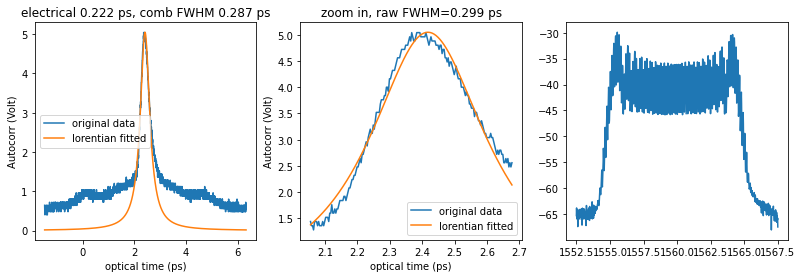

(0.2874494643744724,
 array([0.01640051, 0.0164268 , 0.01645316, ..., 0.01622061, 0.01619481,
        0.01616908]),
 <Figure size 972x288 with 3 Axes>)

In [24]:
filedir = r"Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_test\\"

biaV = 1.2
disp2 = 1.8

lfc.RFoscPS.Vset1 = biaV
lfc.wsp.set3rdDisper(d2=disp2,d3=0.0,preview_plot=False)
lfc.wsp.setBandPass(span=5)# ws.plotStatus()
lfc.wsp.writeProfile()

filename = f"disp2_{disp2:.2f}_biaV_{biaV:.2f}_pwr_{lfc.ptamp.pwrAmp/1000:.2f}_A"
kk=0
spec = osa.get_trace('c', plot=False)
osc.get_autocorr_FWHM_single(filename=filedir+filename+f"_{kk+1:.0f}.mat",
                            fit_range=200,
                            additional_plotdata=spec)



In [51]:
osc.wvfm['Y']

array([0.32, 0.48, 0.4 , ..., 0.48, 0.56, 0.4 ])

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.


Z:\Maodong\Projects\Keck\Keck Comb\LFC\Hardware\TDS2024C.py:165: UserWarning: TDS2024C OSC: Directory Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2 does not exist. Creating new directory.
  warnings.warn(self.devicename+": Directory "+filedir+" does not exist. Creating new directory.")


TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.05_biaV_0.728_pwr_3.70_A_1.mat


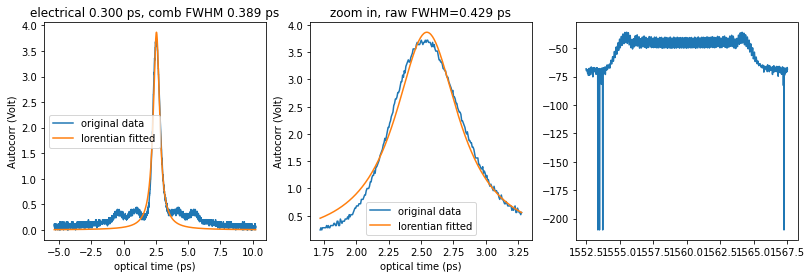

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.05_biaV_0.728_pwr_3.70_A_2.mat


<Figure size 432x288 with 0 Axes>

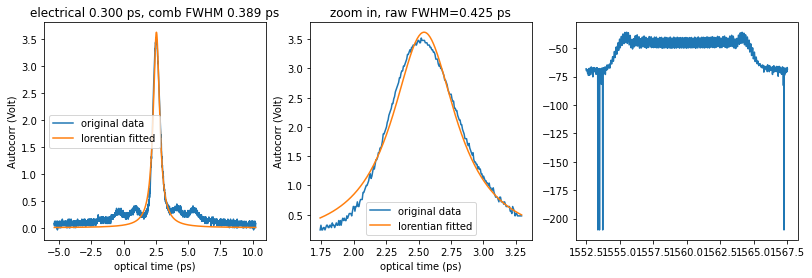

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.05_biaV_0.728_pwr_3.70_A_3.mat


<Figure size 432x288 with 0 Axes>

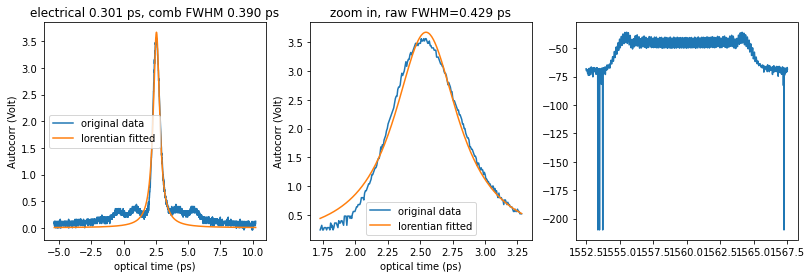

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.06_biaV_0.728_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

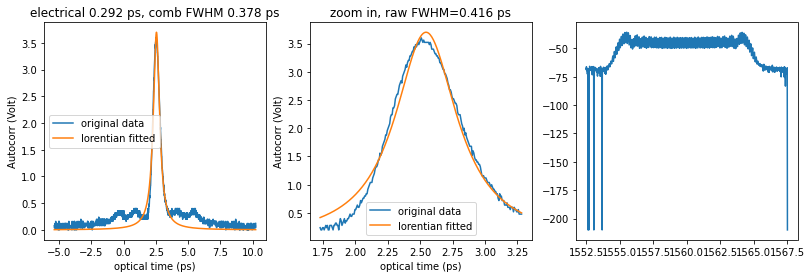

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.06_biaV_0.728_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

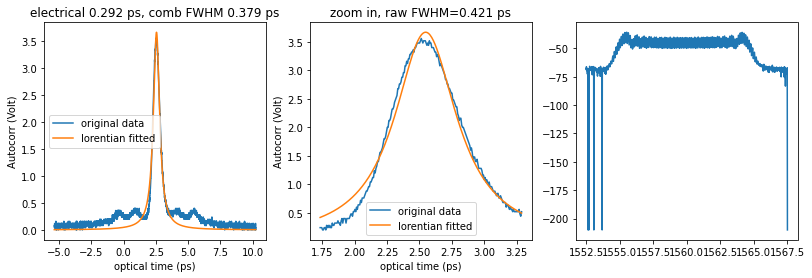

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.06_biaV_0.728_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

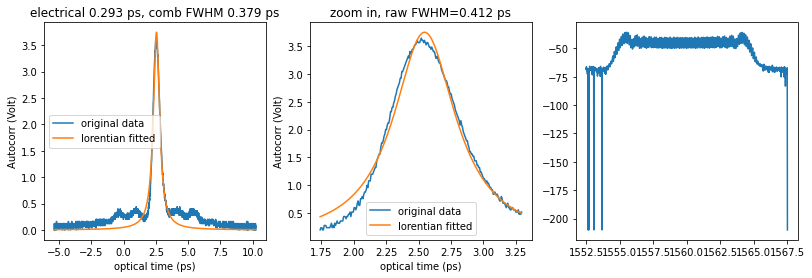

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.07_biaV_0.727_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

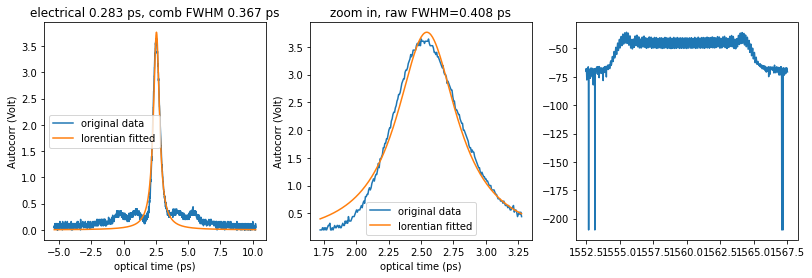

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.07_biaV_0.727_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

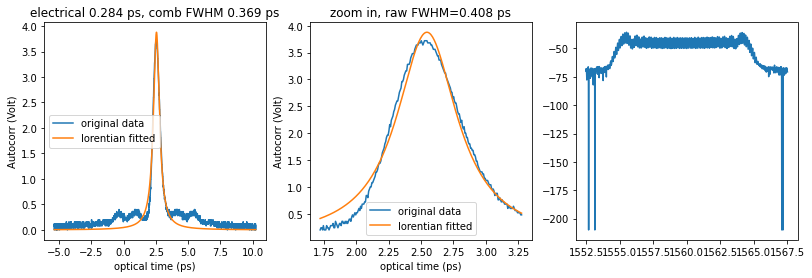

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.07_biaV_0.727_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

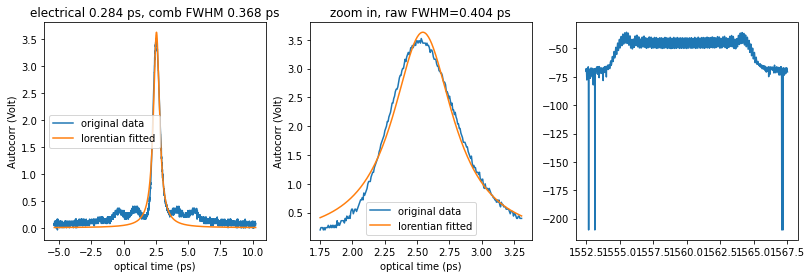

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.08_biaV_0.727_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

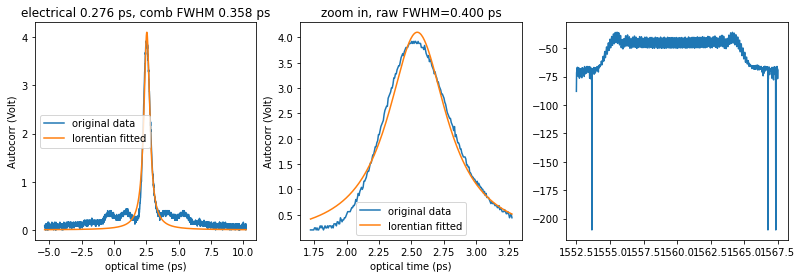

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.08_biaV_0.727_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

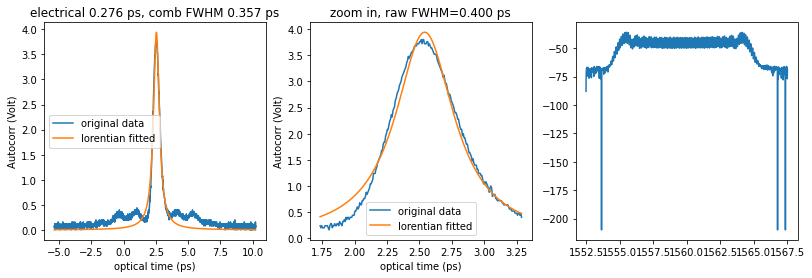

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.08_biaV_0.727_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

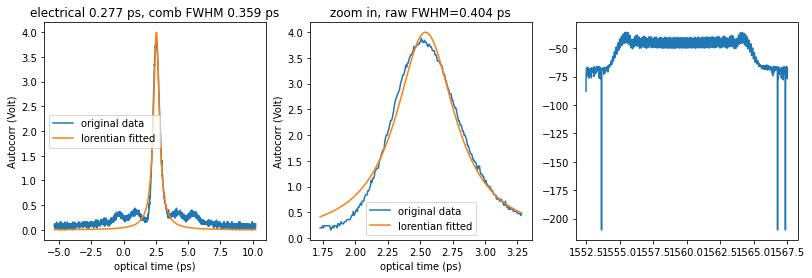

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.09_biaV_0.727_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

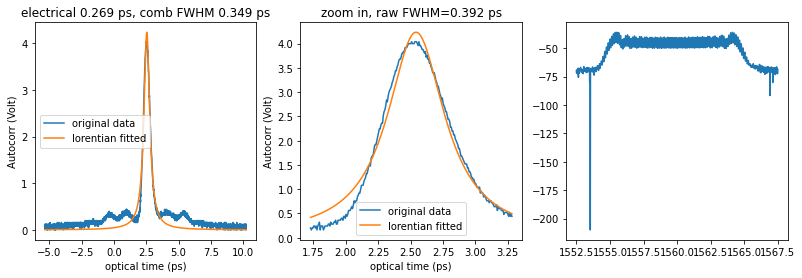

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.09_biaV_0.727_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

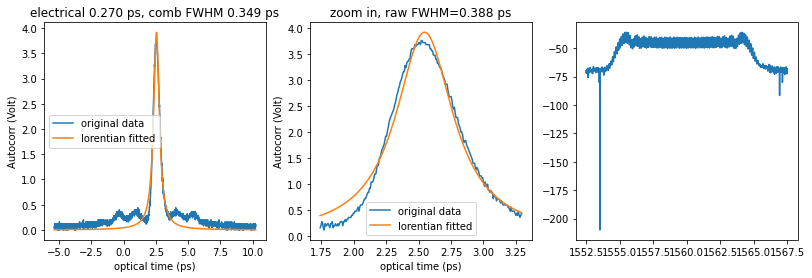

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.09_biaV_0.727_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

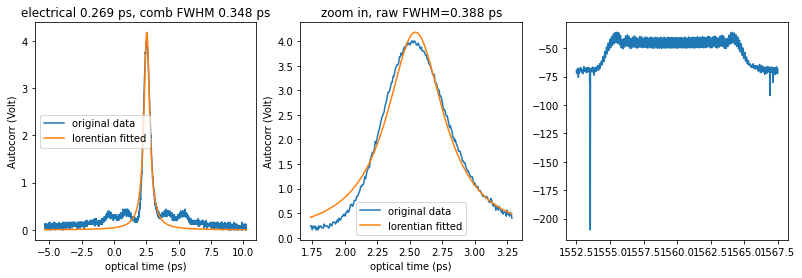

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.10_biaV_0.729_pwr_3.70_A_1.mat


<Figure size 432x288 with 0 Axes>

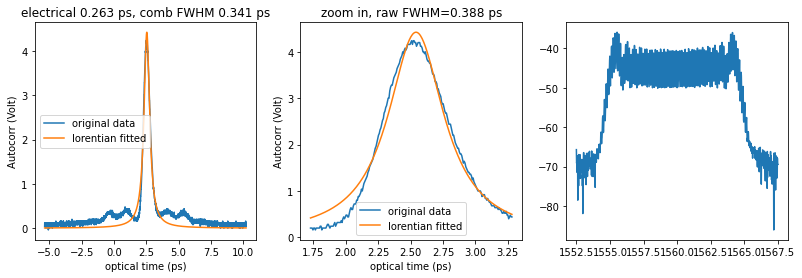

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.10_biaV_0.729_pwr_3.70_A_2.mat


<Figure size 432x288 with 0 Axes>

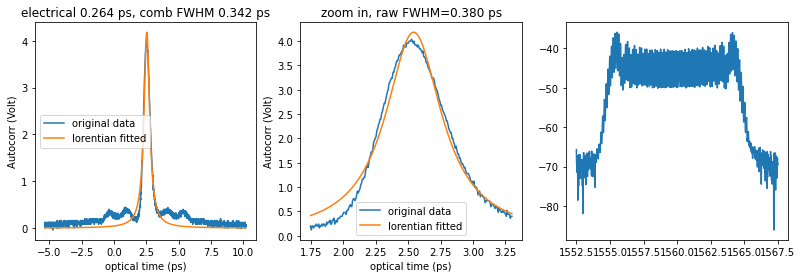

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.10_biaV_0.729_pwr_3.70_A_3.mat


<Figure size 432x288 with 0 Axes>

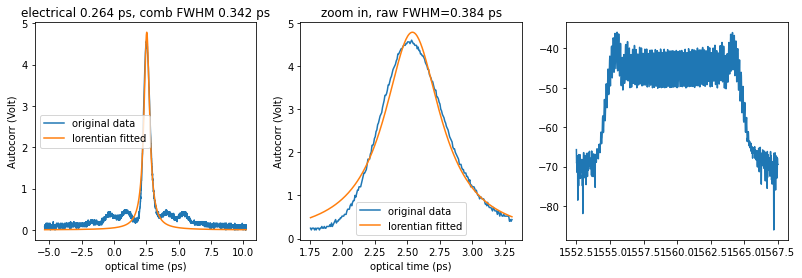

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.11_biaV_0.729_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

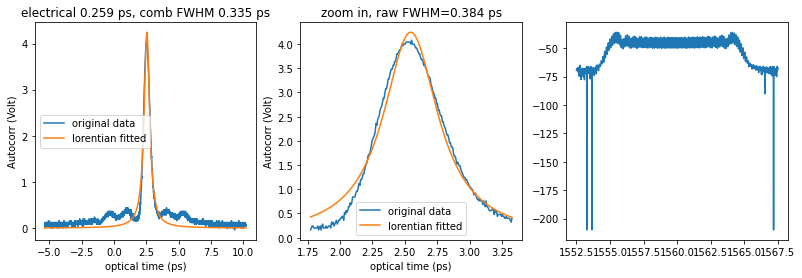

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.11_biaV_0.729_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

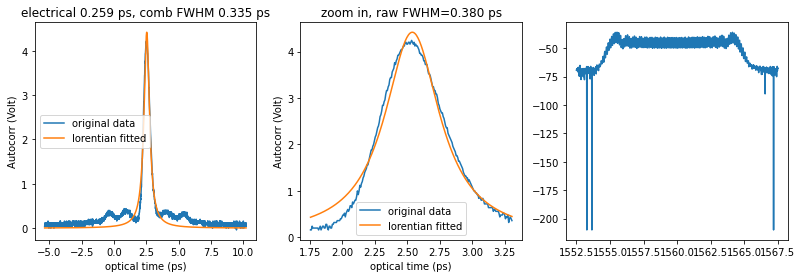

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.11_biaV_0.729_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

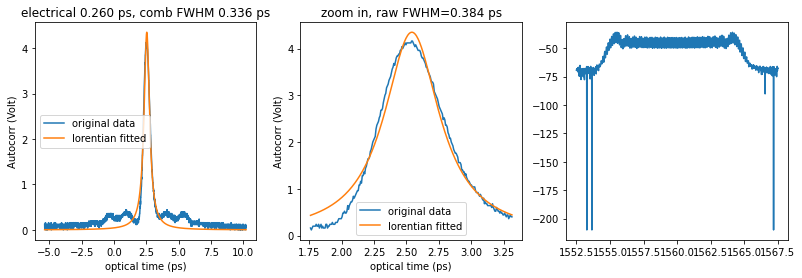

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.12_biaV_0.730_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

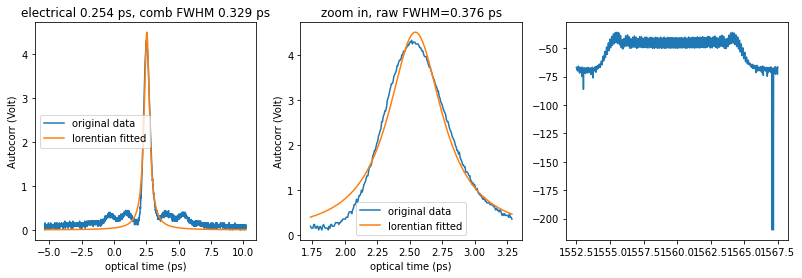

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.12_biaV_0.730_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

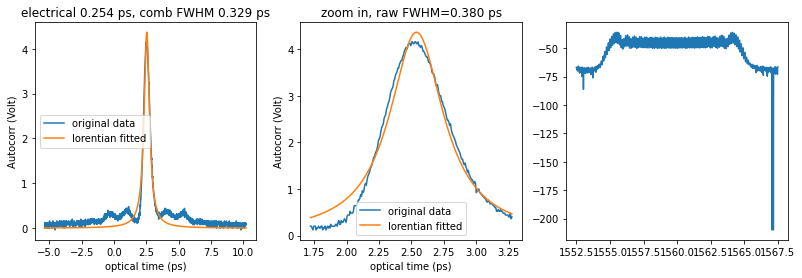

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.12_biaV_0.730_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

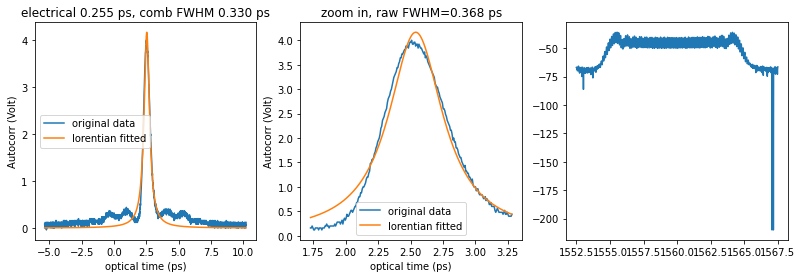

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.13_biaV_0.730_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

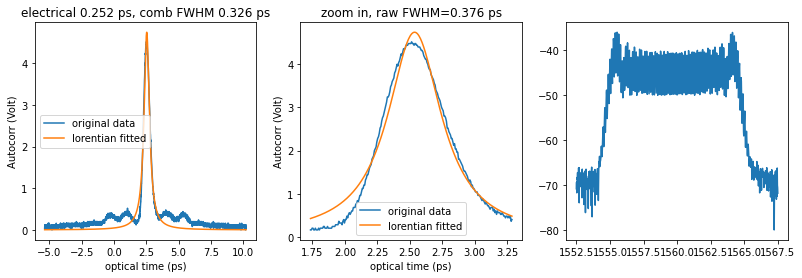

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.13_biaV_0.730_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

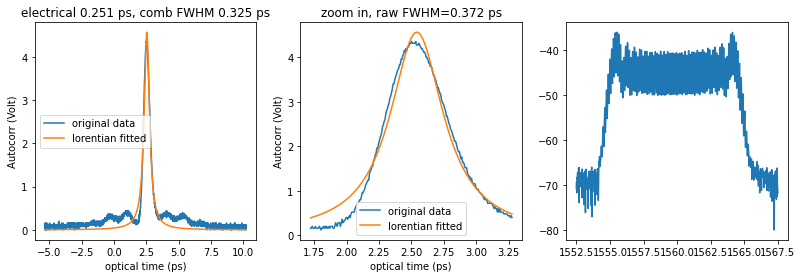

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.13_biaV_0.730_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

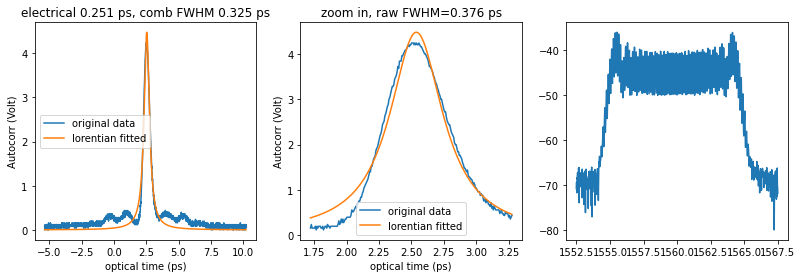

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.14_biaV_0.731_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

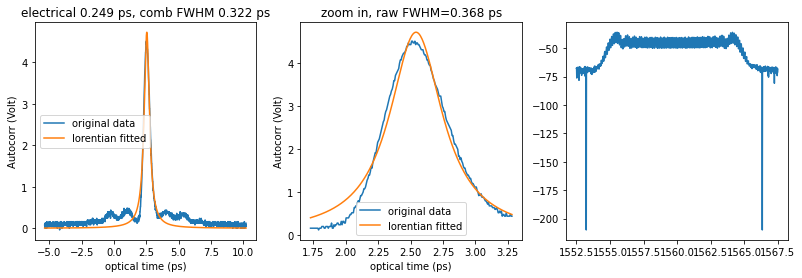

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.14_biaV_0.731_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

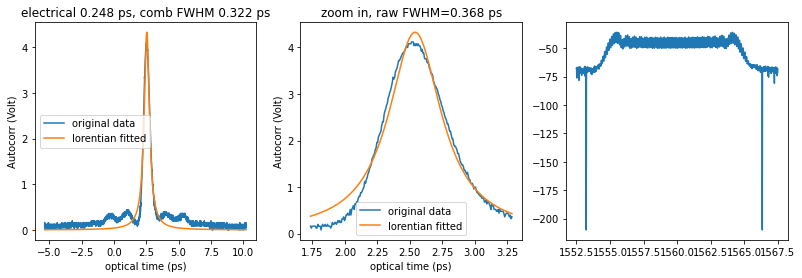

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.14_biaV_0.731_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

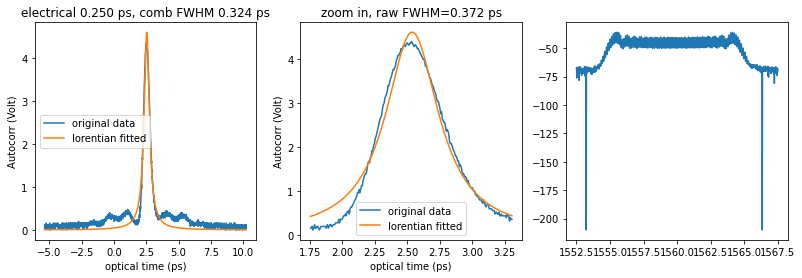

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.15_biaV_0.732_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

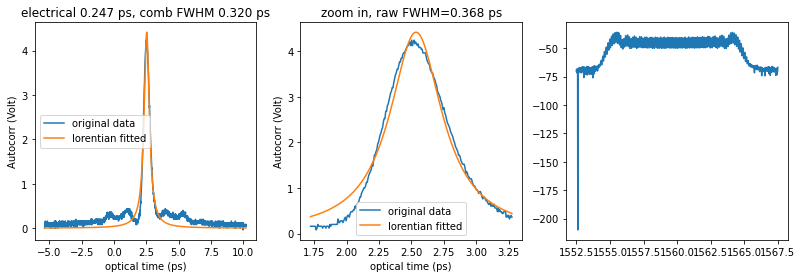

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.15_biaV_0.732_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

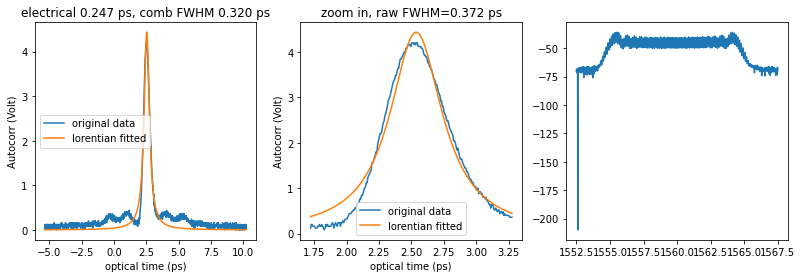

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.15_biaV_0.732_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

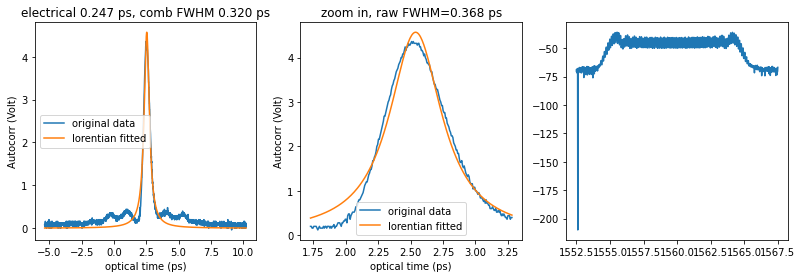

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.16_biaV_0.731_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

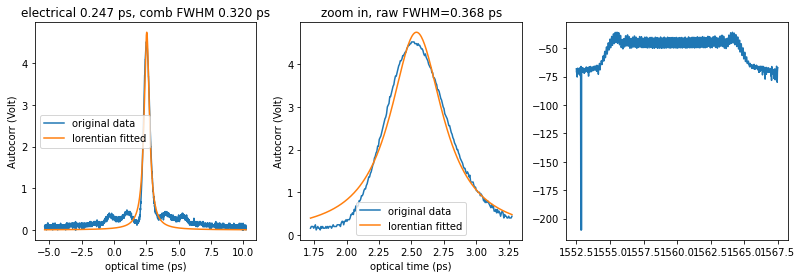

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.16_biaV_0.731_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

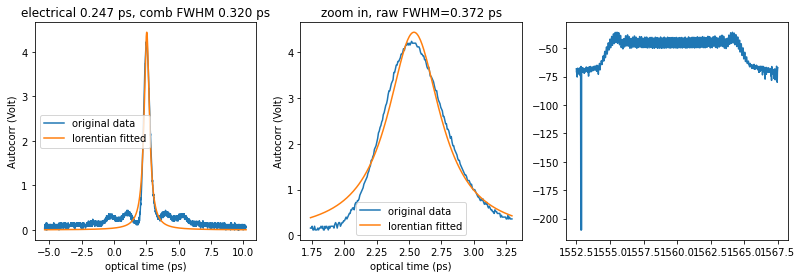

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.16_biaV_0.731_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

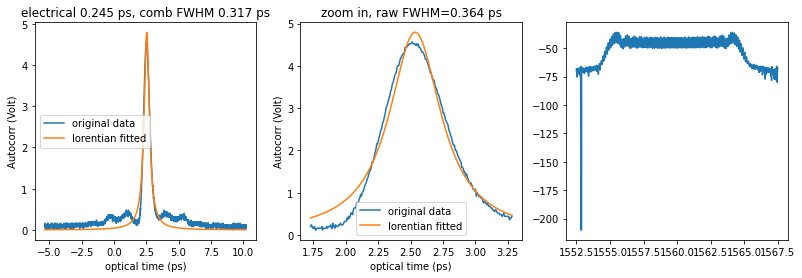

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.17_biaV_0.730_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

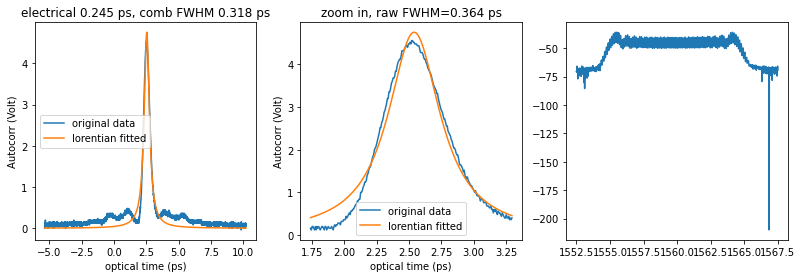

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.17_biaV_0.730_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

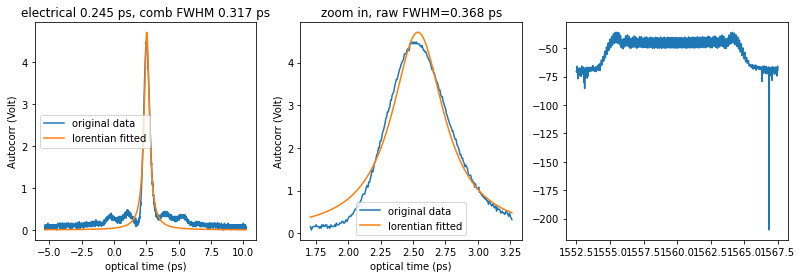

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.17_biaV_0.730_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

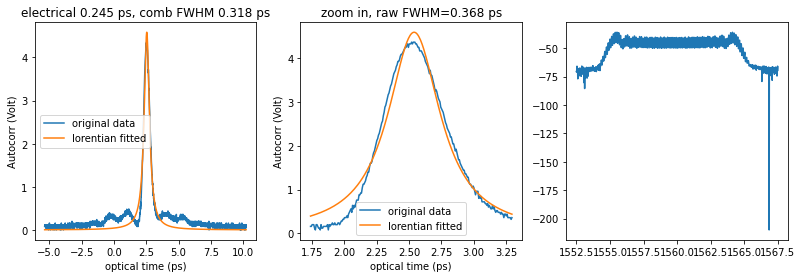

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.18_biaV_0.730_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

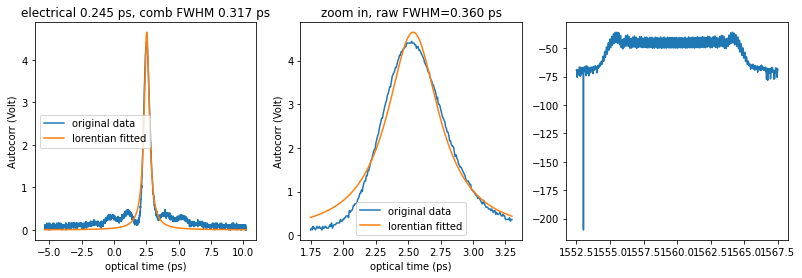

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.18_biaV_0.730_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

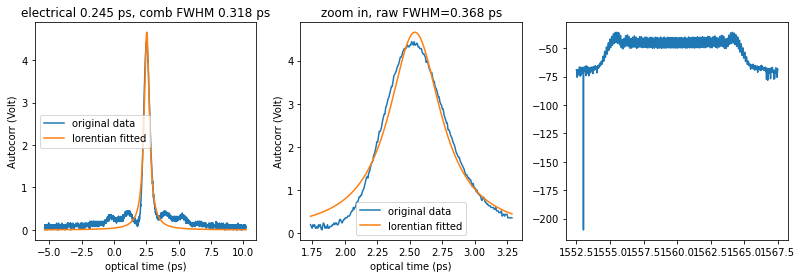

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.18_biaV_0.730_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

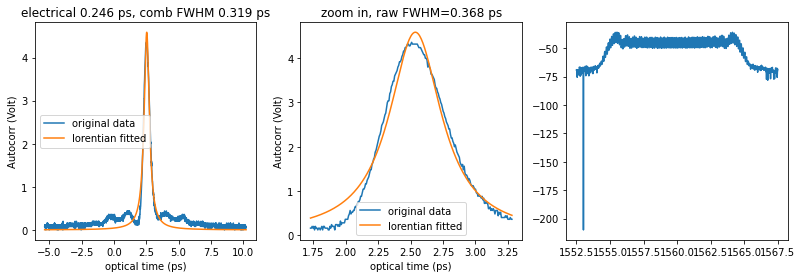

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.19_biaV_0.731_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

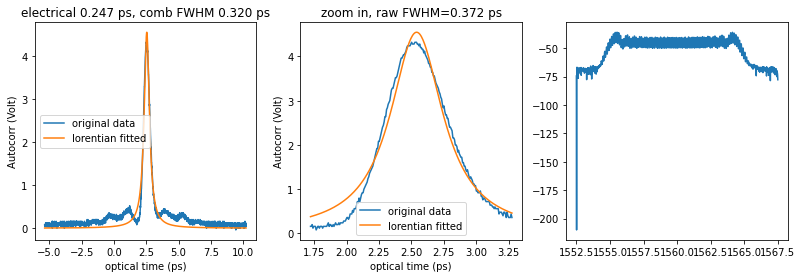

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.19_biaV_0.731_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

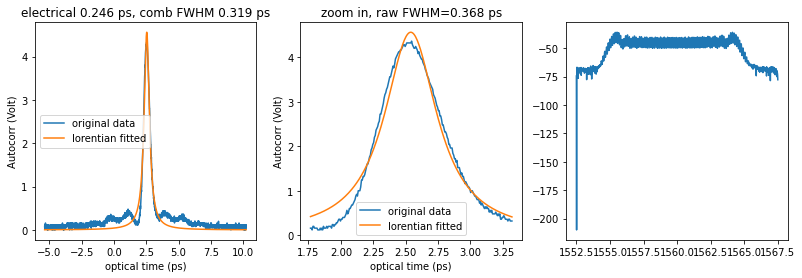

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.19_biaV_0.731_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

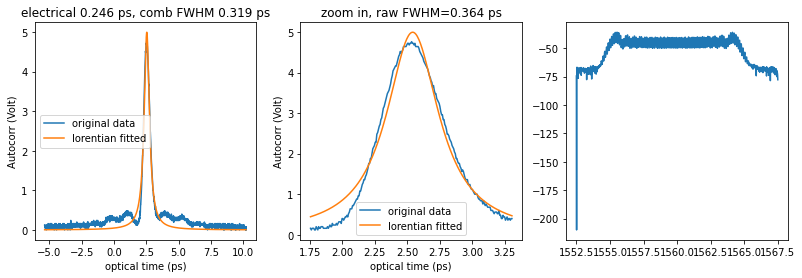

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.20_biaV_0.733_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

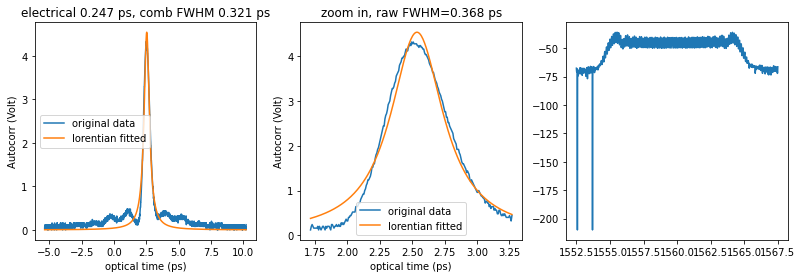

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.20_biaV_0.733_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

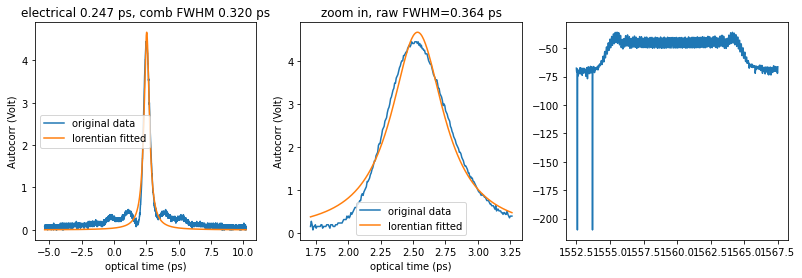

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.20_biaV_0.733_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

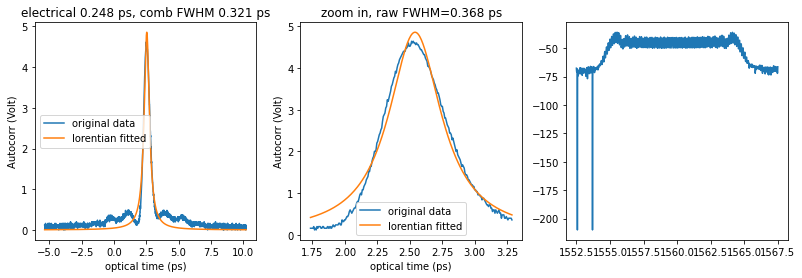

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.21_biaV_0.732_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

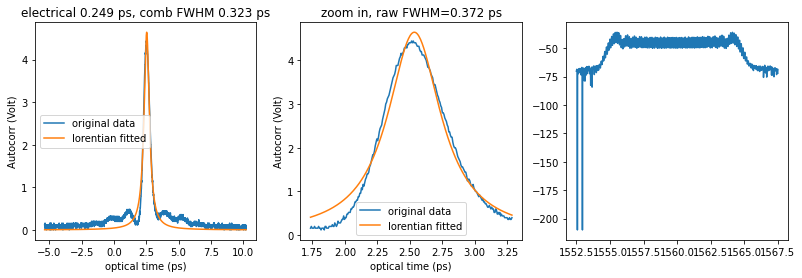

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.21_biaV_0.732_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

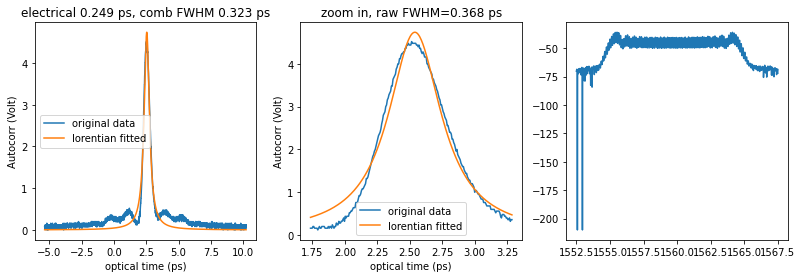

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.21_biaV_0.732_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

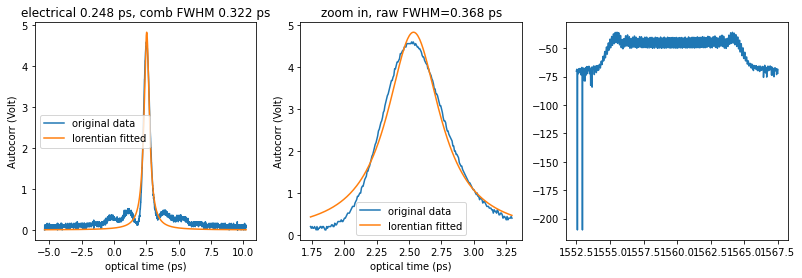

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.22_biaV_0.733_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

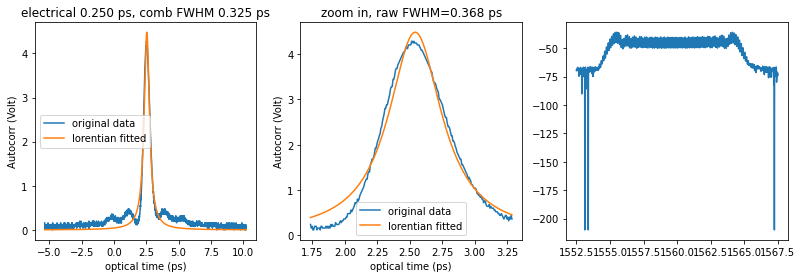

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.22_biaV_0.733_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

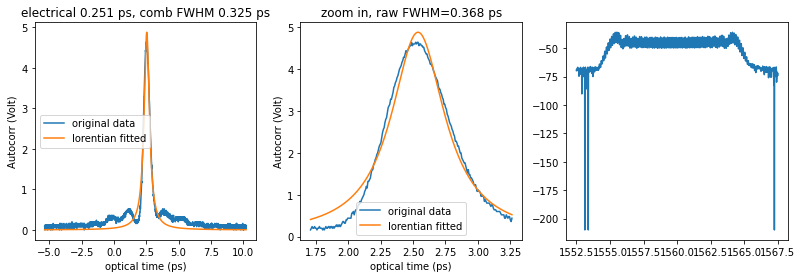

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.22_biaV_0.733_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

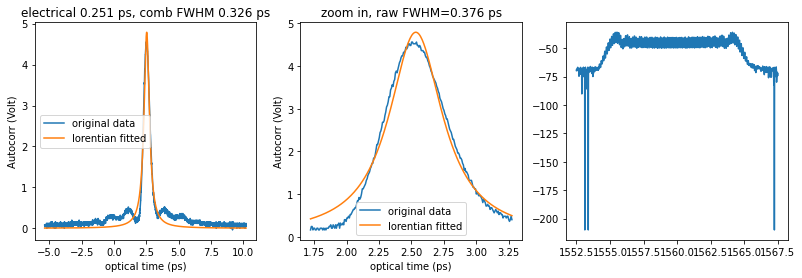

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.23_biaV_0.731_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

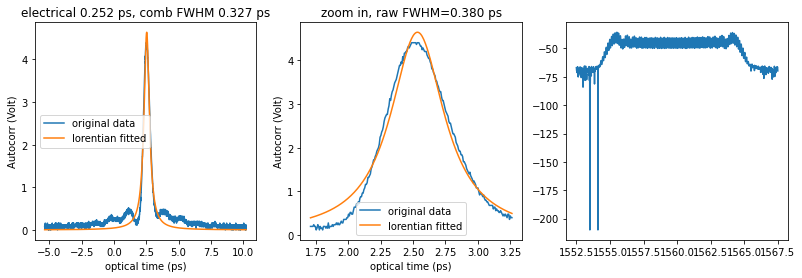

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.23_biaV_0.731_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

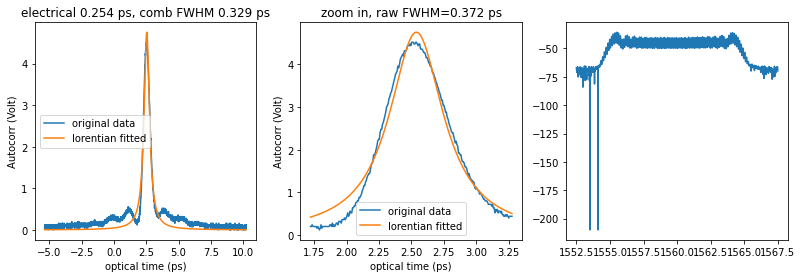

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.23_biaV_0.731_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

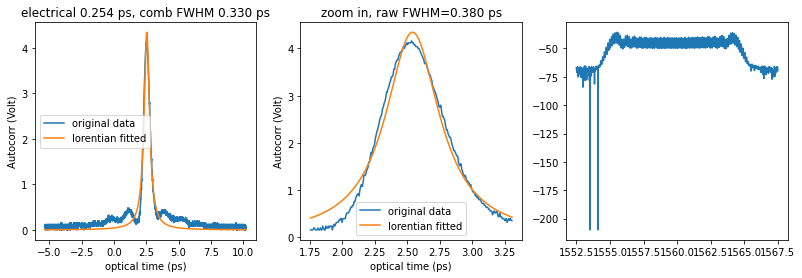

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.24_biaV_0.731_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

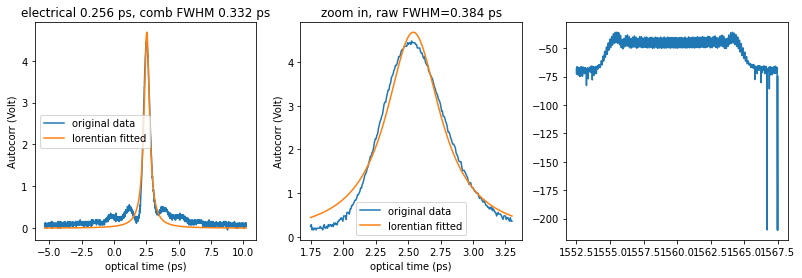

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.24_biaV_0.731_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

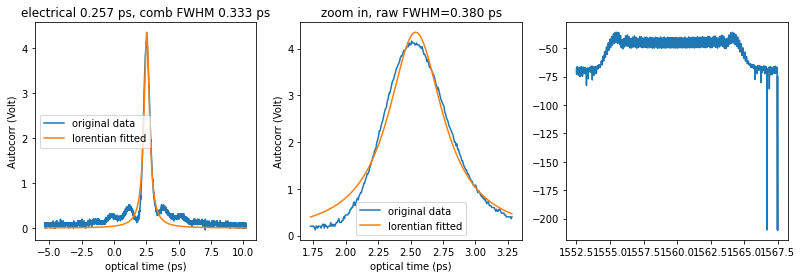

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.24_biaV_0.731_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

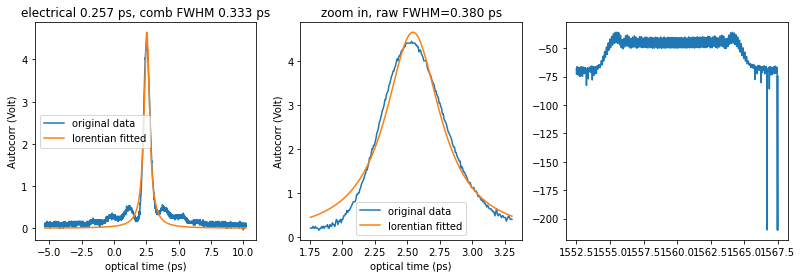

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.25_biaV_0.733_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

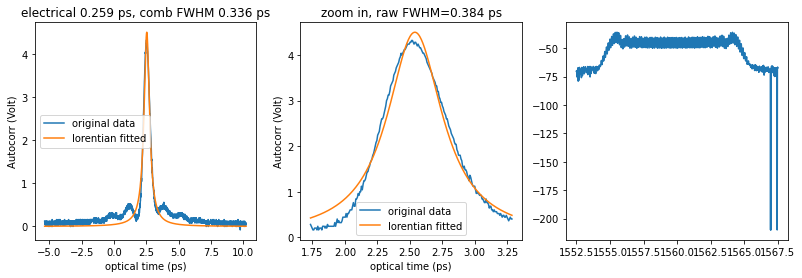

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.25_biaV_0.733_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

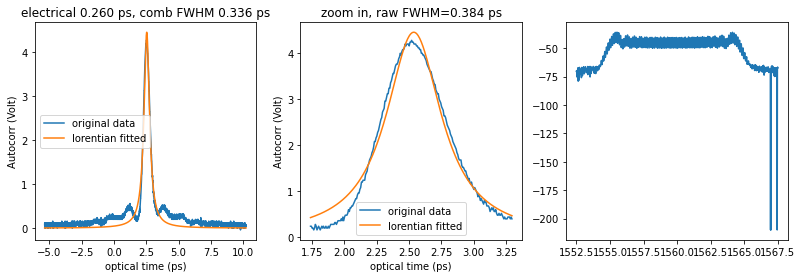

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\disp2_2.25_biaV_0.733_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

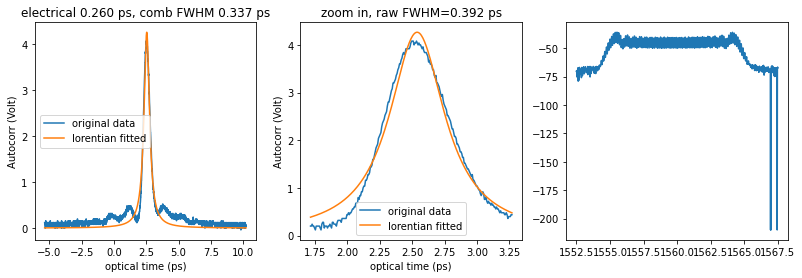

<Figure size 432x288 with 0 Axes>

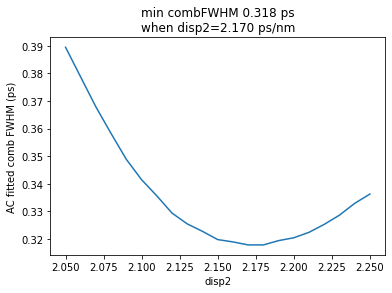

In [107]:
import numpy as np
import matplotlib.pyplot as plt
filedir = r"Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_fine_2\\"

result = []
# biaV_list = np.linspace(1.1,1.3,5)
# biaV = servo2.output_voltage
disp2_list= np.linspace(2.05, 2.25, 21)
# for ii,biaV in enumerate(biaV_list):
#     lfc.RFoscPS.Vset1 = biaV
#     FWHM_list = []
for jj, disp2 in enumerate(disp2_list):
    lfc.wsp.set3rdDisper(d2=disp2, d3= -0.0, preview_plot=0)
    lfc.wsp.setBandPass(span=5)# ws.plotStatus()
    lfc.wsp.writeProfile()

    pw_list = []
    filename = f"disp2_{disp2:.2f}_biaV_{servo2.output_voltage:.3f}_pwr_{lfc.ptamp.pwrAmp/1000:.2f}_A"
    spec = osa.get_trace('c', plot=False)
    for kk in range(3):
        pw,_, fig = osc.get_autocorr_FWHM_single(filename=filedir+filename+f"_{kk+1:.0f}.mat",
                        fit_range=250,
                        additional_plotdata=spec)
        pw_list.append(pw)
        plt.draw()
    result.append(pw_list)
    
to_save = {'result':result, 'disp2_list':disp2_list}
from scipy.io import savemat
savemat(filedir+'results.mat', to_save)

###### Plot results begins here
import matplotlib.pyplot as plt
result_mean = np.mean(np.array(result),axis=1)
fig = plt.figure()
plt.plot(disp2_list, result_mean)
plt.xlabel("disp2")
plt.ylabel("AC fitted comb FWHM (ps)")
plt.title(f"min combFWHM {np.min(result_mean):.3f} ps\n"+
         f"when disp2={disp2_list[np.argmin(result_mean)]:.3f} ps/nm")
plt.show()
fig.savefig(filedir+'results.png')

In [106]:
np.linspace(2.05, 2.25, 21)

array([2.05, 2.06, 2.07, 2.08, 2.09, 2.1 , 2.11, 2.12, 2.13, 2.14, 2.15,
       2.16, 2.17, 2.18, 2.19, 2.2 , 2.21, 2.22, 2.23, 2.24, 2.25])

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.100V
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.


Z:\Maodong\Projects\Keck\Keck Comb\LFC\Hardware\TDS2024C.py:165: UserWarning: TDS2024C OSC: Directory Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2 does not exist. Creating new directory.
  warnings.warn(self.devicename+": Directory "+filedir+" does not exist. Creating new directory.")


TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.10_pwr_3.69_A_1.mat


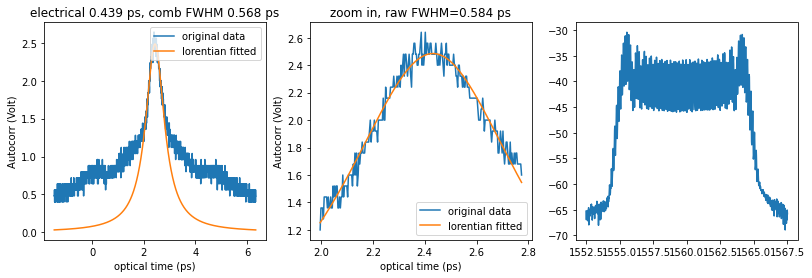

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.10_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

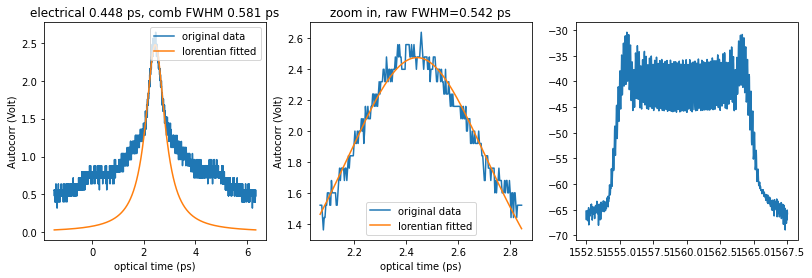

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.10_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

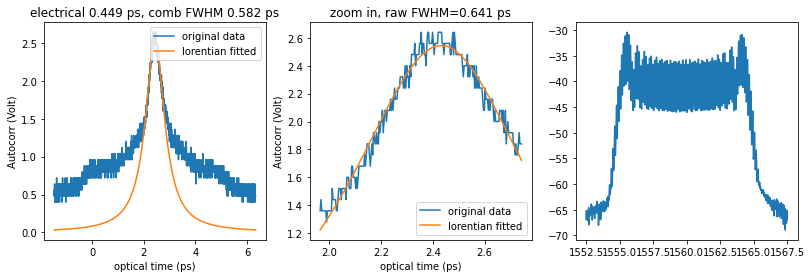

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.10_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

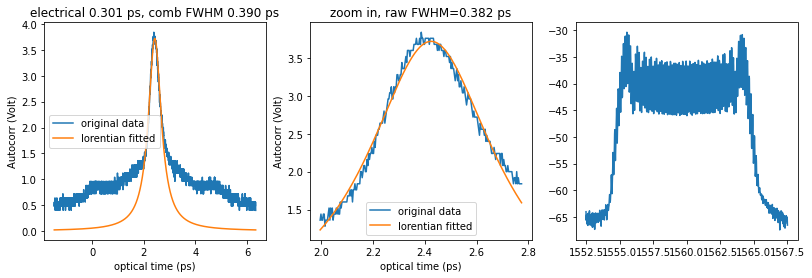

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.10_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

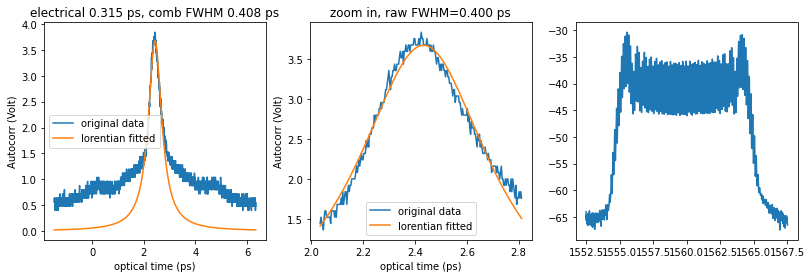

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.10_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

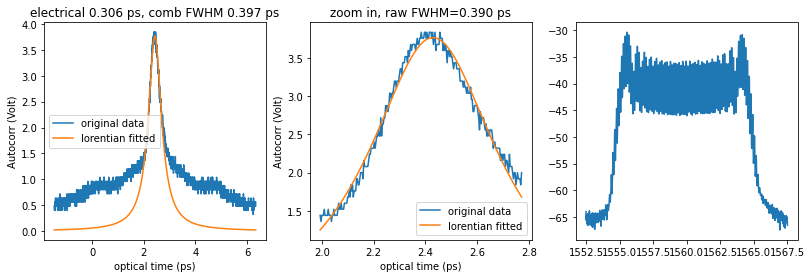

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.10_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

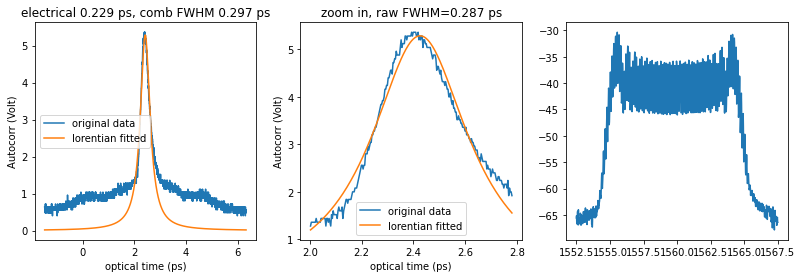

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.10_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

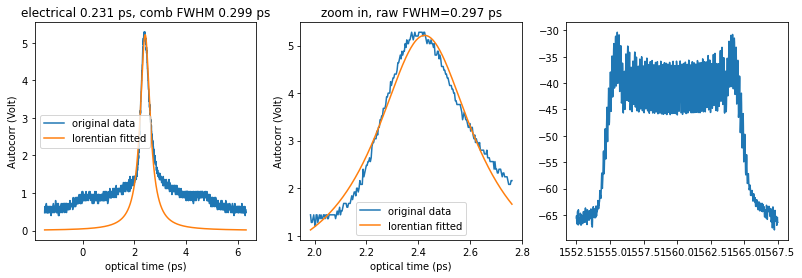

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.10_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

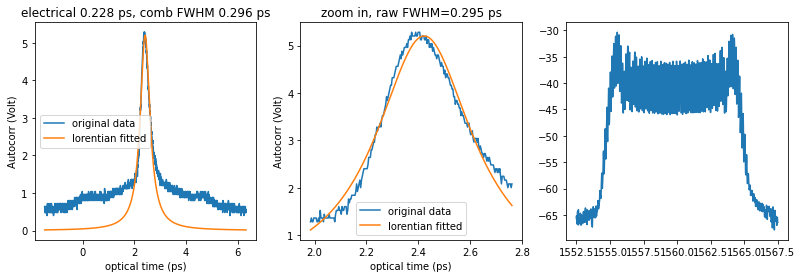

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.10_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

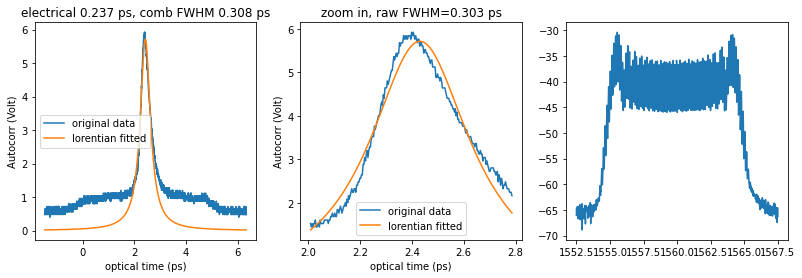

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.10_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

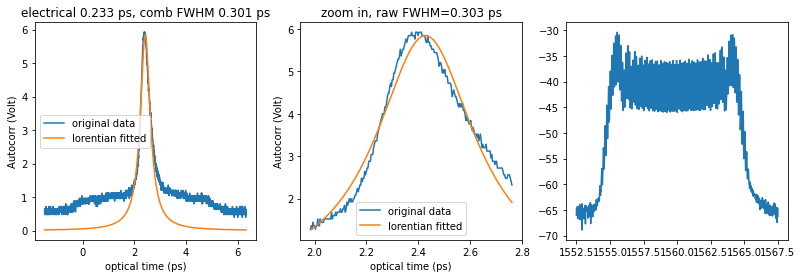

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.10_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

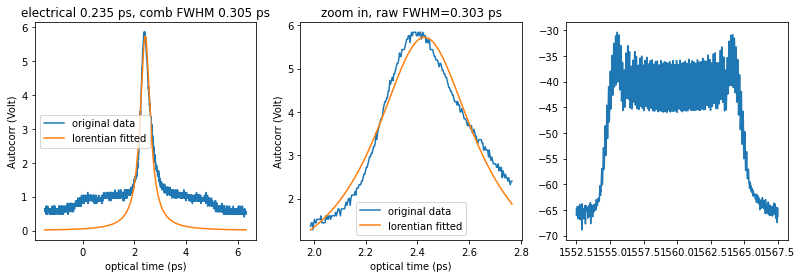

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.10_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

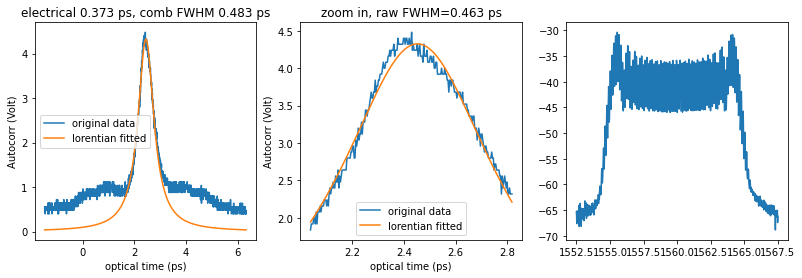

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.10_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

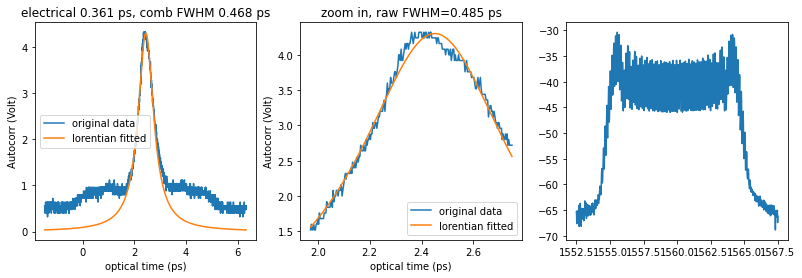

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.10_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

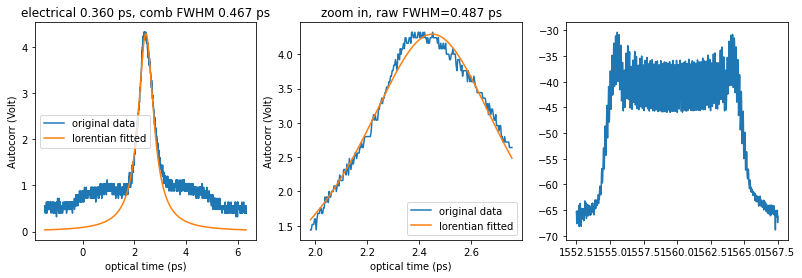

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.150V
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.15_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

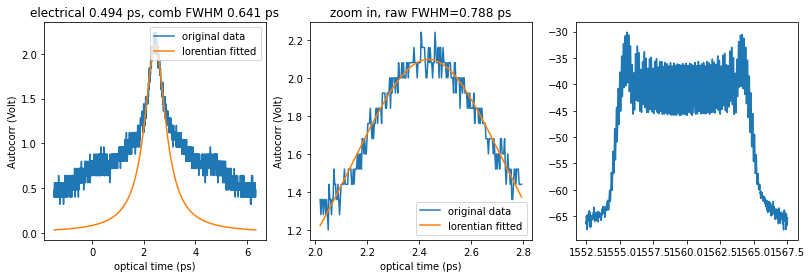

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.15_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

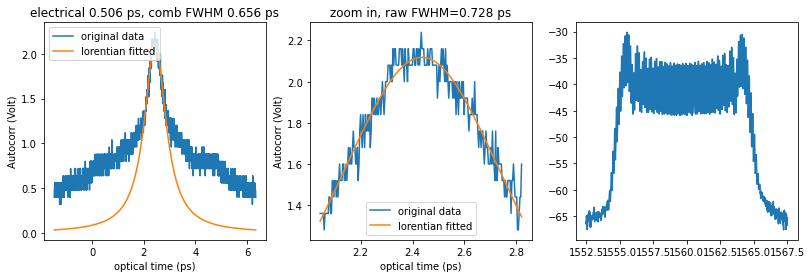

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.15_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

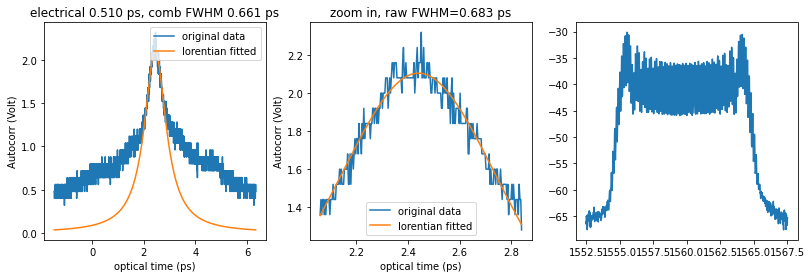

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.15_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

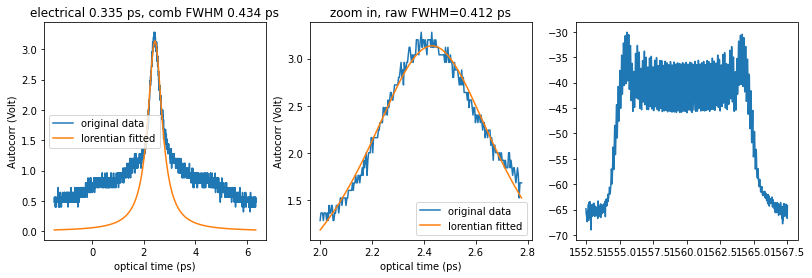

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.15_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

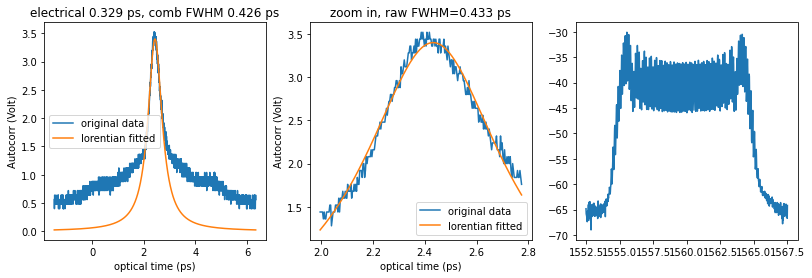

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.15_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

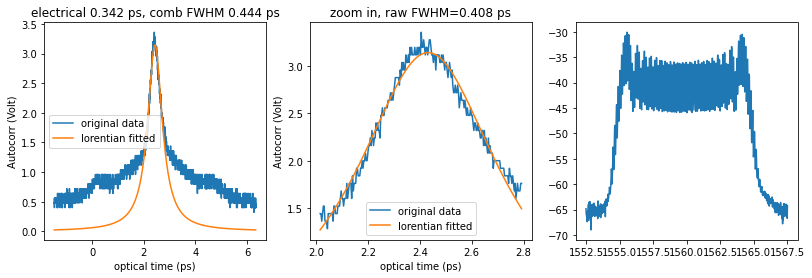

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.15_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

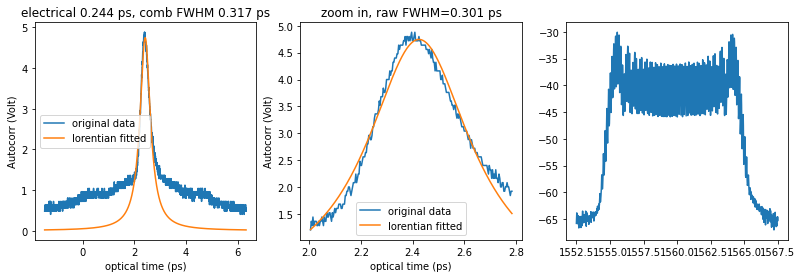

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.15_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

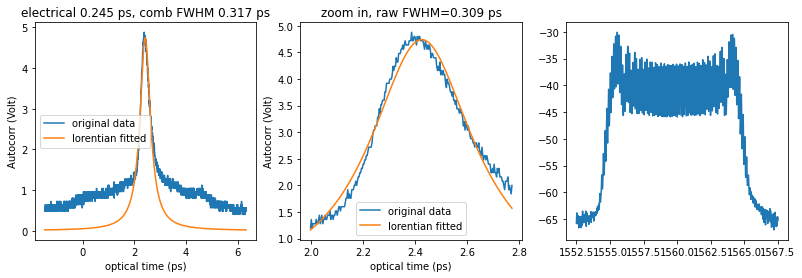

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.15_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

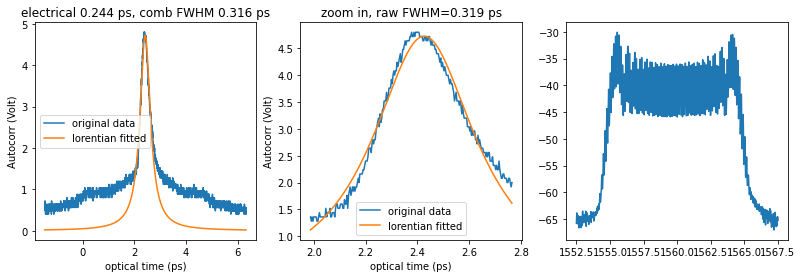

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.15_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

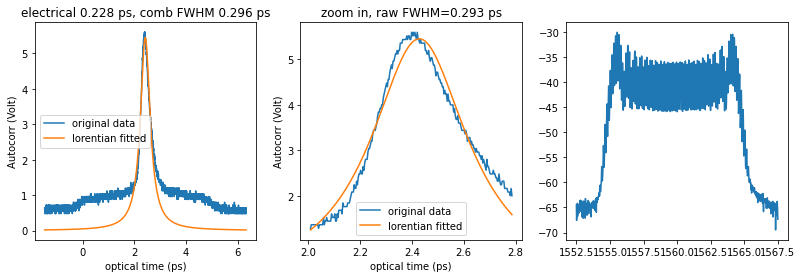

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.15_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

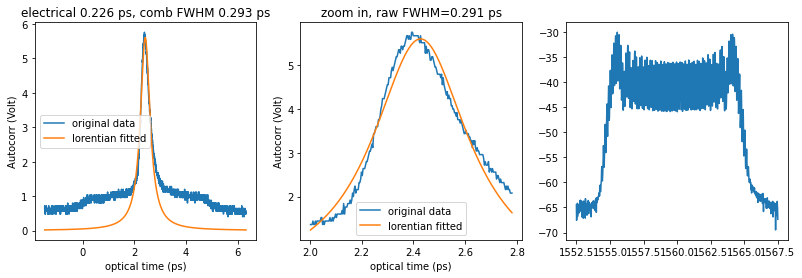

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.15_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

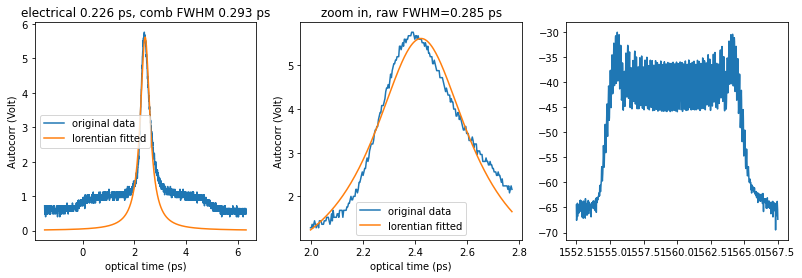

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.15_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

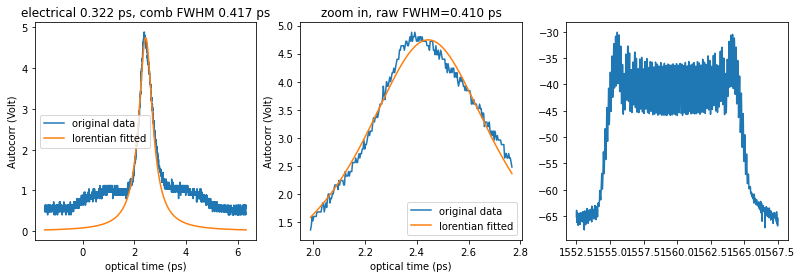

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.15_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

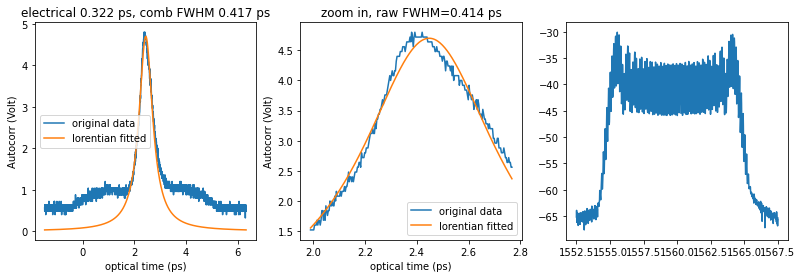

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.15_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

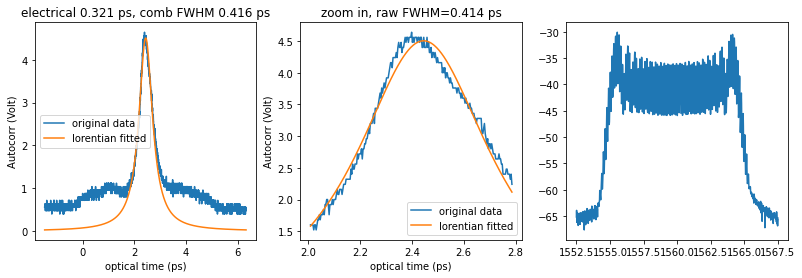

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.200V
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.20_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

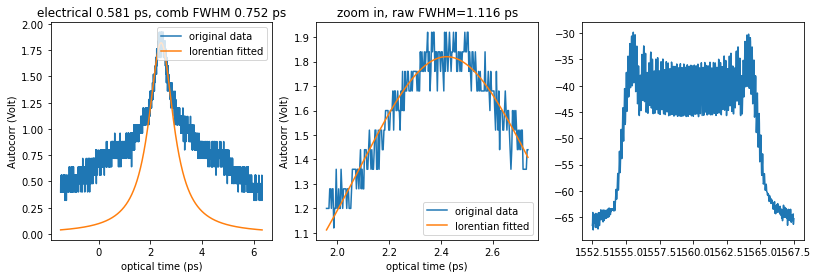

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.20_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

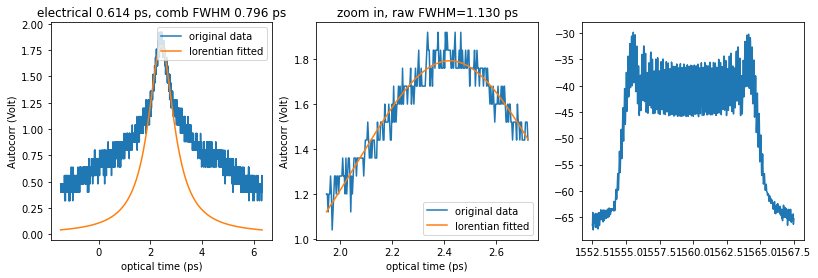

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.20_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

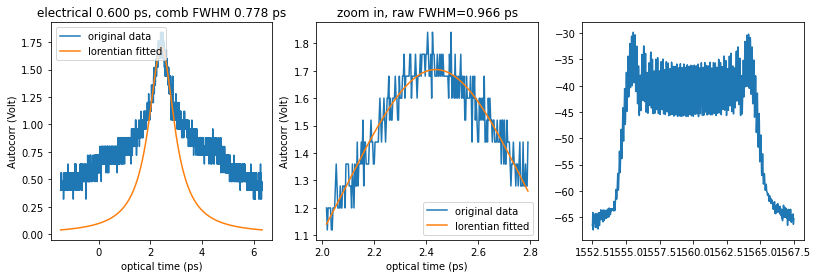

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.20_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

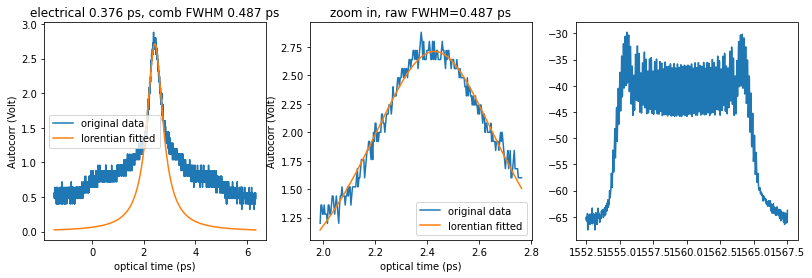

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.20_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

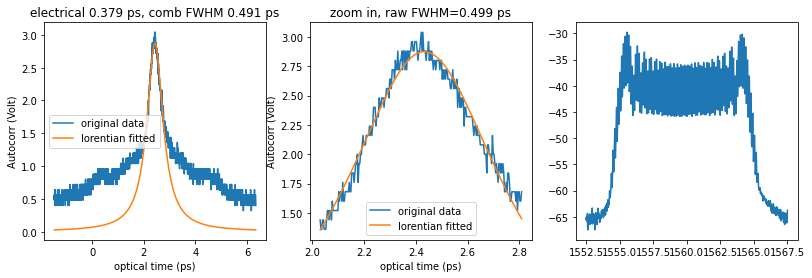

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.20_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

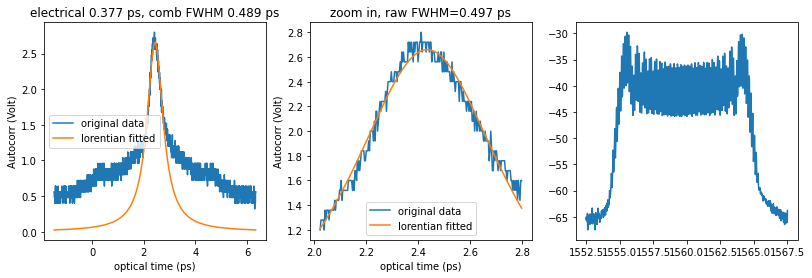

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.20_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

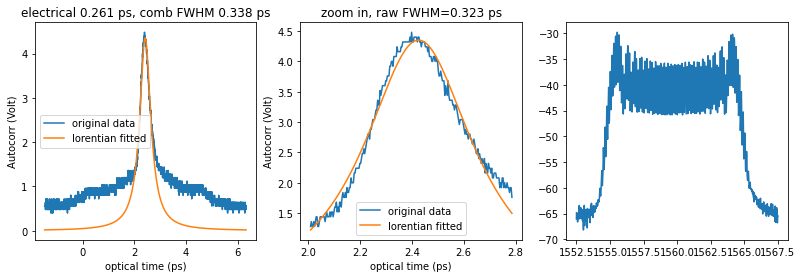

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.20_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

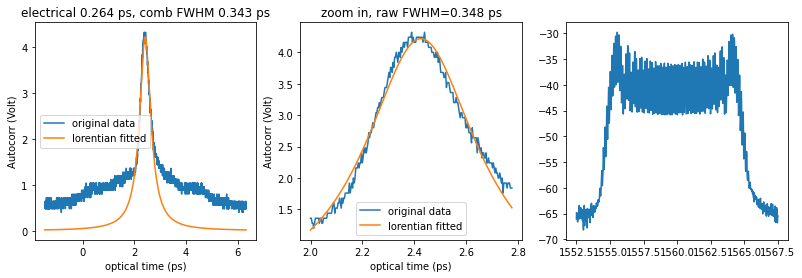

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.20_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

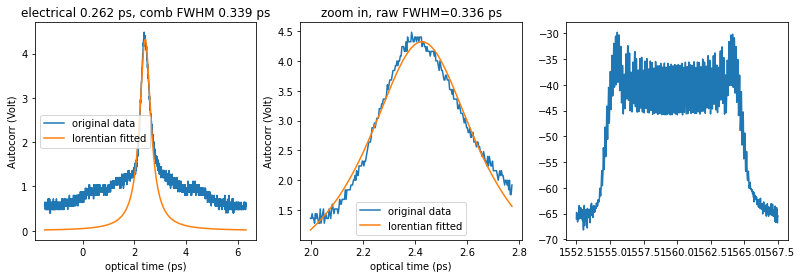

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.20_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

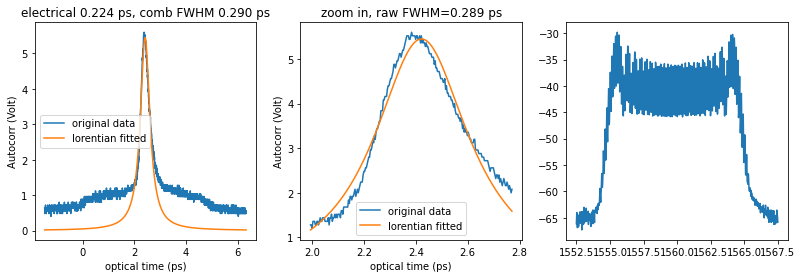

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.20_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

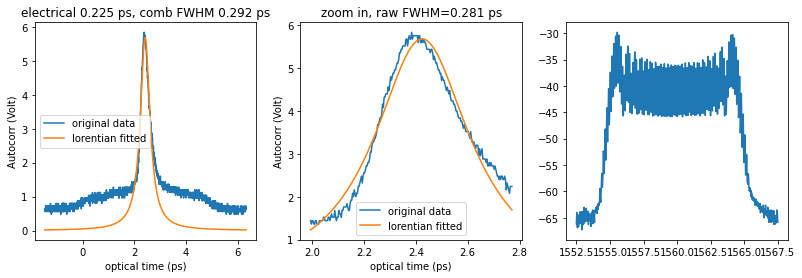

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.20_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

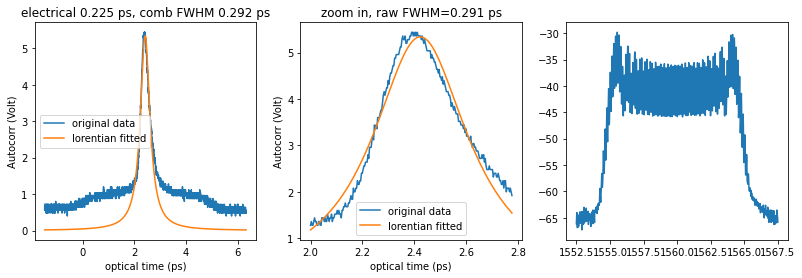

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.20_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

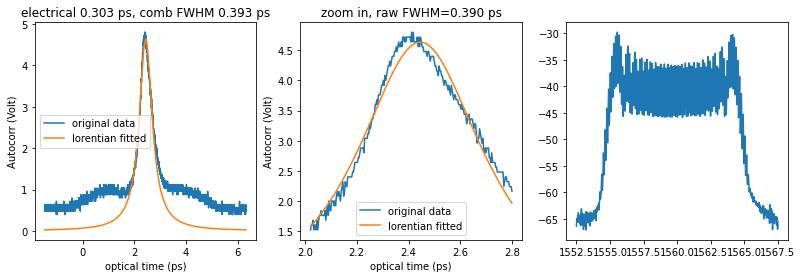

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.20_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

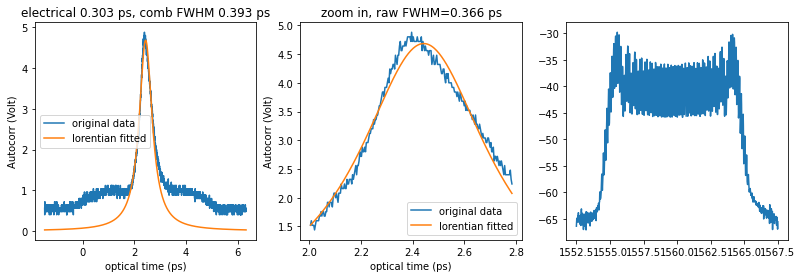

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.20_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

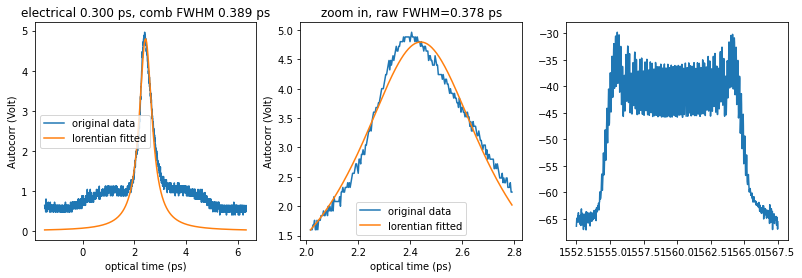

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.250V
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.25_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

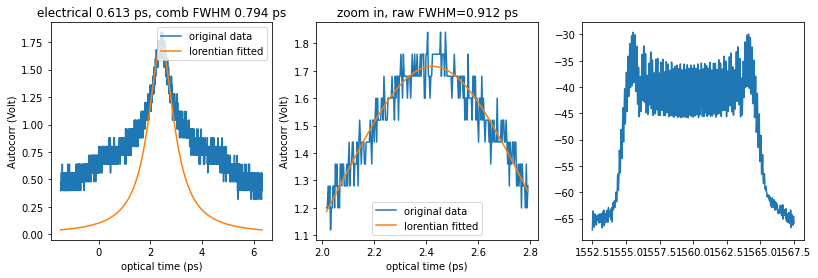

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.25_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

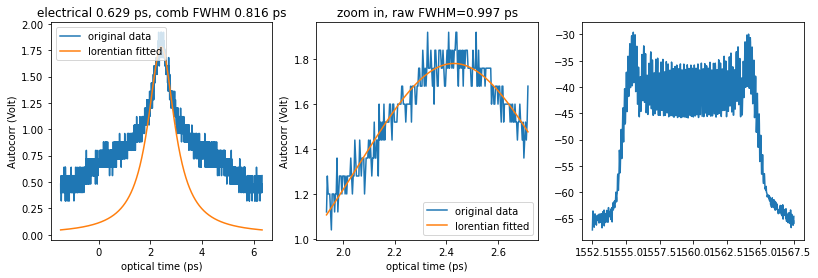

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.25_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

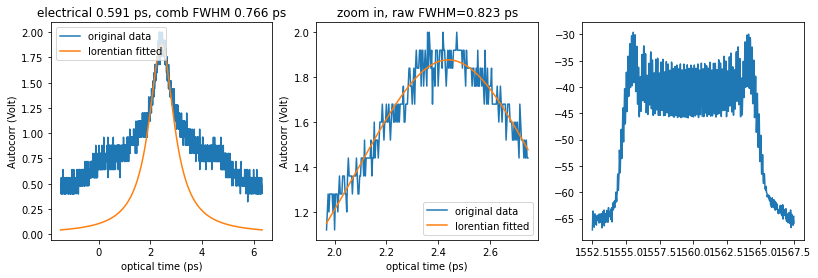

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.25_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

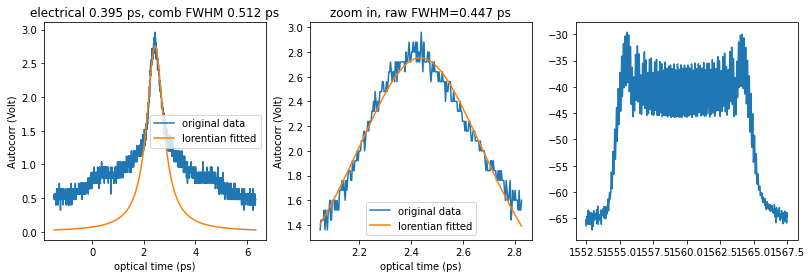

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.25_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

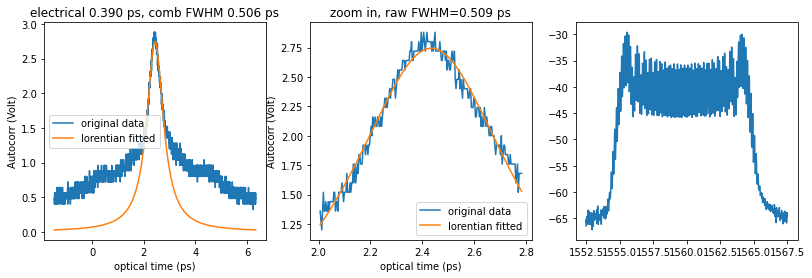

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.25_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

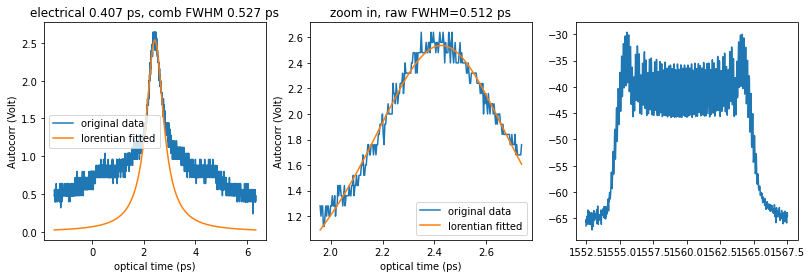

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.25_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

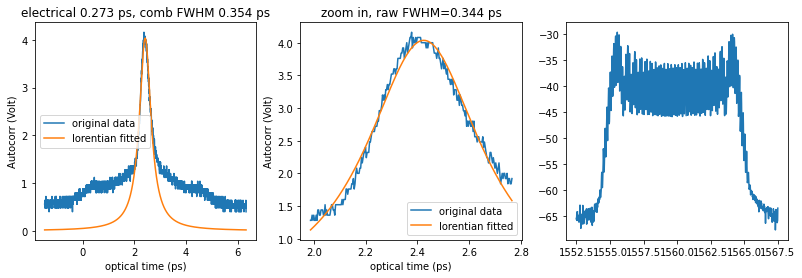

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.25_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

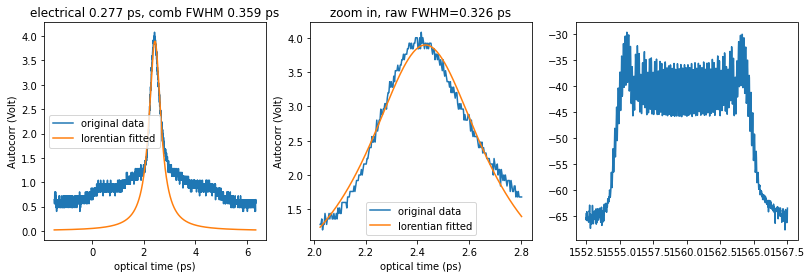

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.25_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

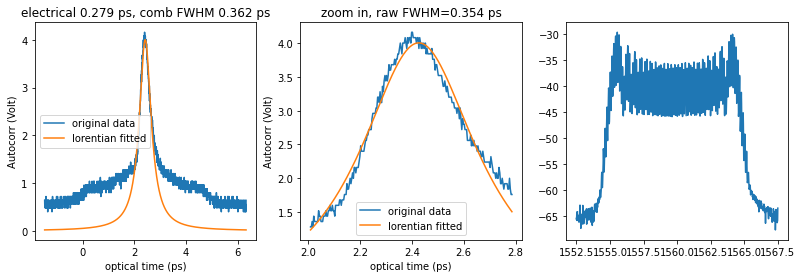

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.25_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

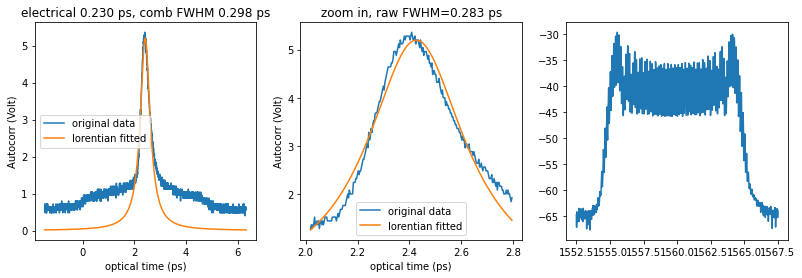

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.25_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

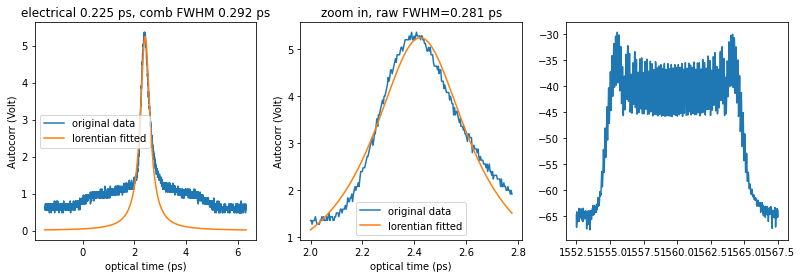

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.25_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

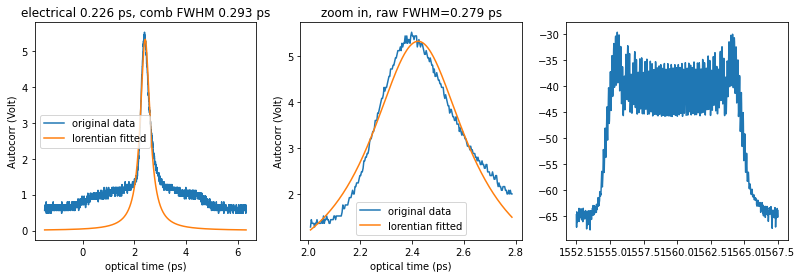

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.25_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

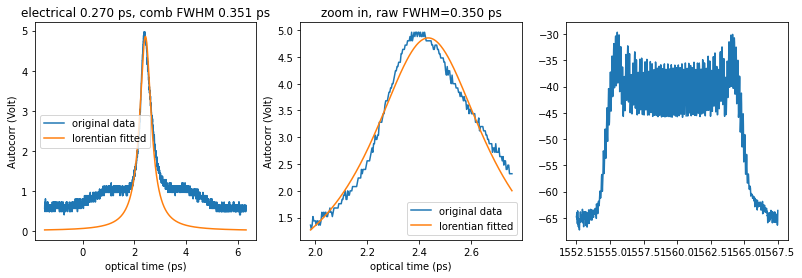

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.25_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

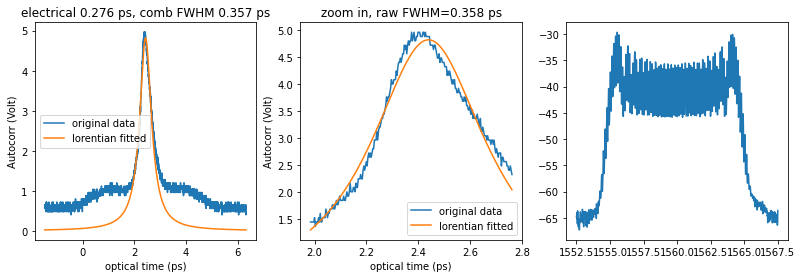

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.25_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

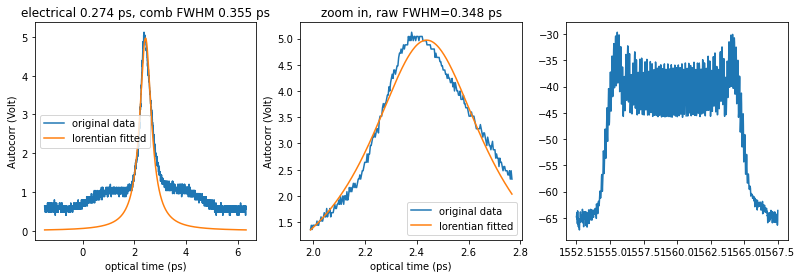

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.300V
Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.30_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

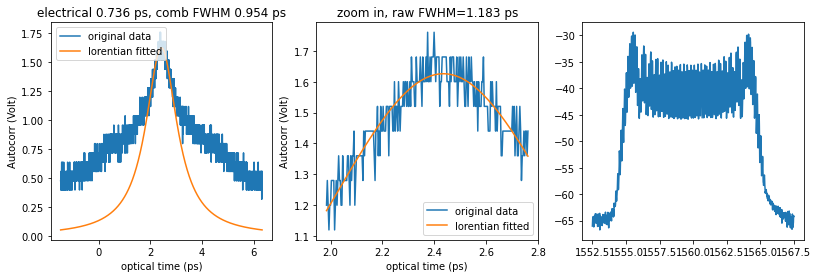

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.30_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

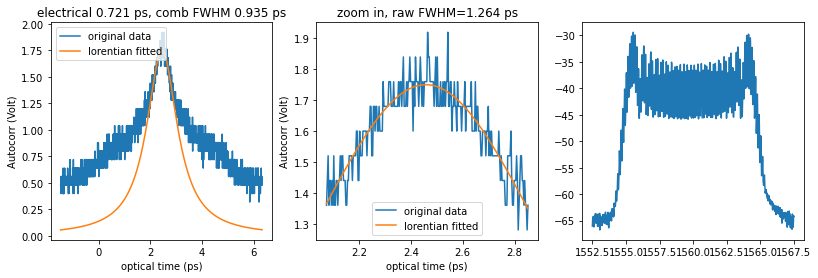

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.70_biaV_1.30_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

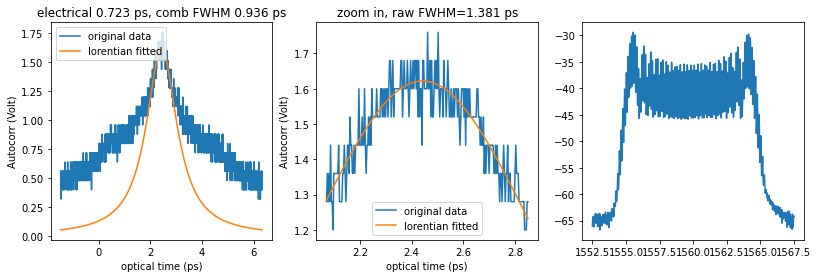

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.30_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

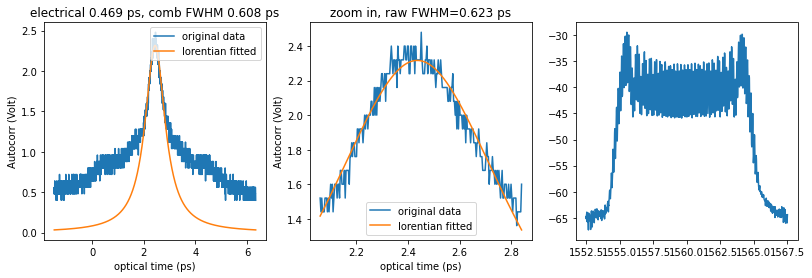

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.30_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

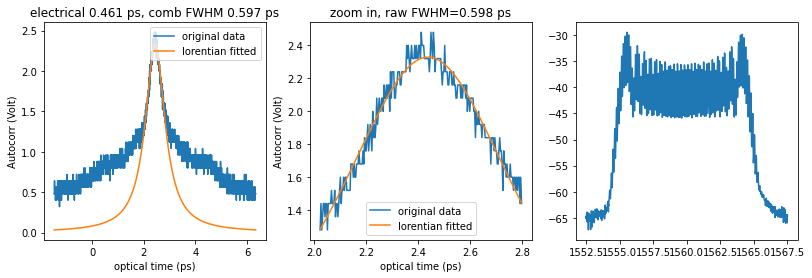

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.75_biaV_1.30_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

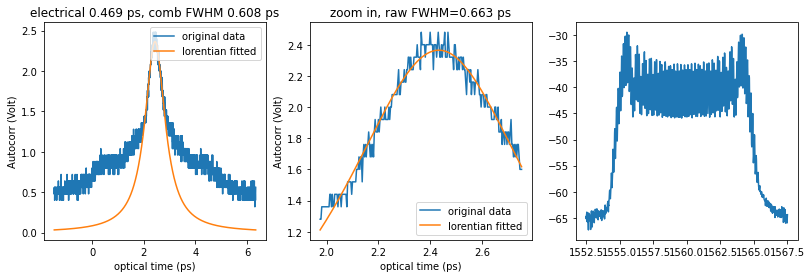

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.30_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

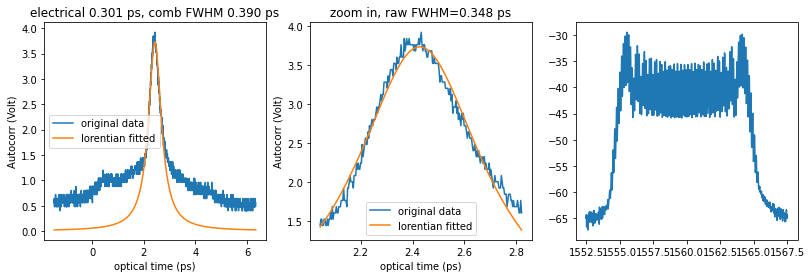

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.30_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

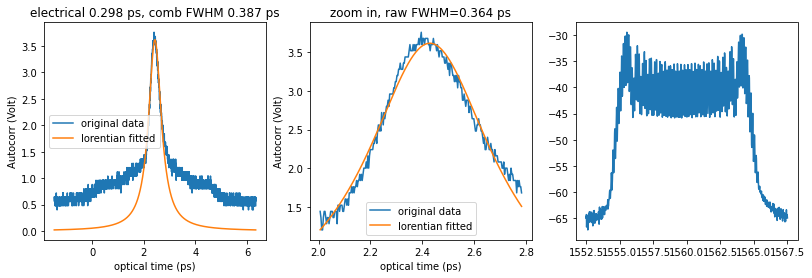

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.80_biaV_1.30_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

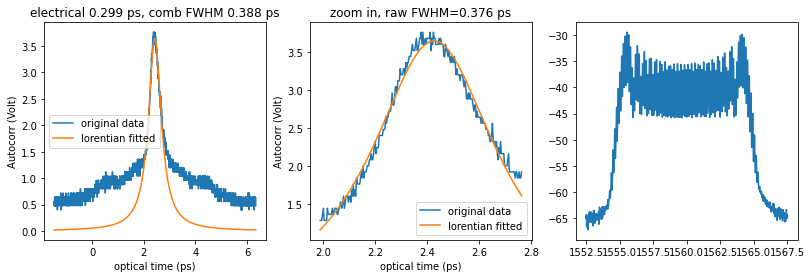

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.30_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

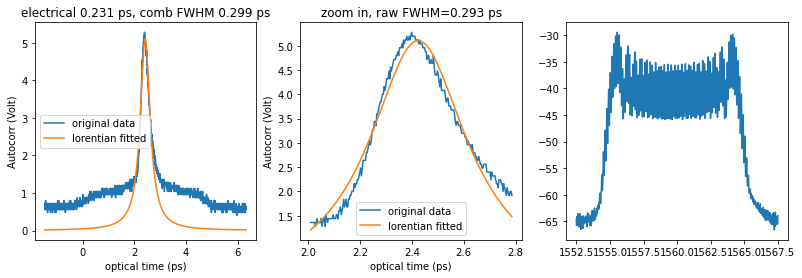

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.30_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

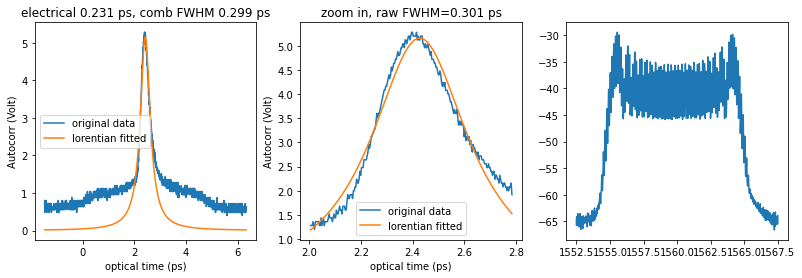

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.85_biaV_1.30_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

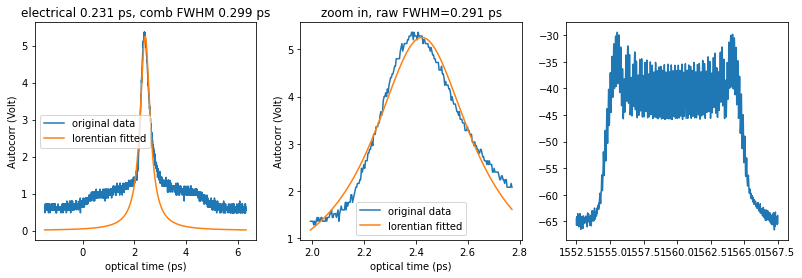

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.30_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

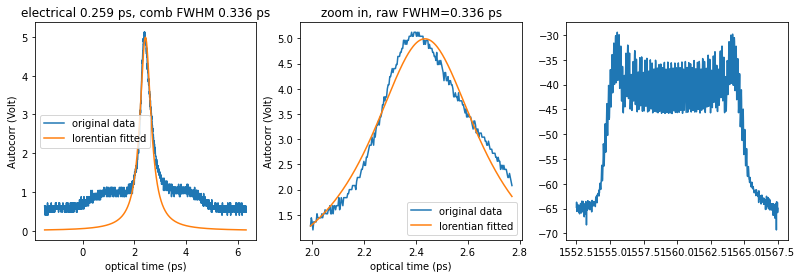

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.30_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

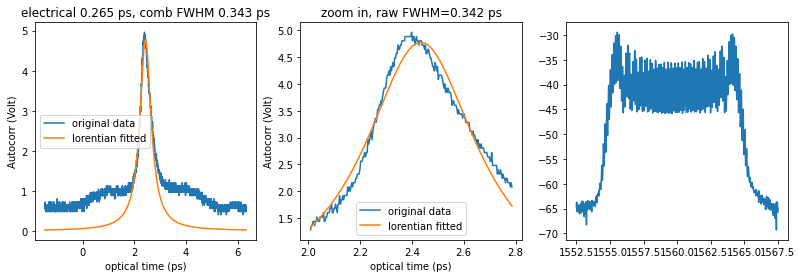

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST100cm_2\\disp2_1.90_biaV_1.30_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

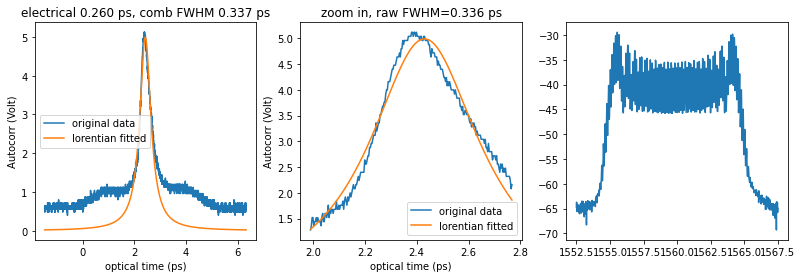

<Figure size 432x288 with 0 Axes>

In [25]:
import numpy as np
import matplotlib.pyplot as plt
filedir = r"Z:\Maodong\Projects\Keck\Compression Stage test\20221013\EO_input_test\\"

result = []
biaV_list = np.linspace(1.1,1.3,5)
disp2_list= np.linspace(1.7,1.9,5)
for ii,biaV in enumerate(biaV_list):
    lfc.RFoscPS.Vset1 = biaV
    FWHM_list = []
    for jj, disp2 in enumerate(disp2_list):
        lfc.wsp.set3rdDisper(d2=disp2, d3= -0.0, preview_plot=0)
        lfc.wsp.setBandPass(span=5)# ws.plotStatus()
        lfc.wsp.writeProfile()
        
        pw_list = []
        filename = f"disp2_{disp2:.2f}_biaV_{biaV:.2f}_pwr_{lfc.ptamp.pwrAmp/1000:.2f}_A"
        spec = osa.get_trace('c', plot=False)
        for kk in range(3):
            pw,_, fig = osc.get_autocorr_FWHM_single(filename=filedir+filename+f"_{kk+1:.0f}.mat",
                            fit_range=250,
                            additional_plotdata=spec)
            pw_list.append(pw)
            plt.draw()
        FWHM_list.append(pw_list)
    result.append(FWHM_list)
    
to_save = {'result':result, 'biaV_list':biaV_list, 'disp2_list':disp2_list}
from scipy.io import savemat
savemat(filedir+'results.mat', to_save)

fig

In [26]:
to_save = {'result':result, 'biaV_list':biaV_list, 'disp2_list':disp2_list}
from scipy.io import savemat
savemat(filedir+'results.mat', to_save)

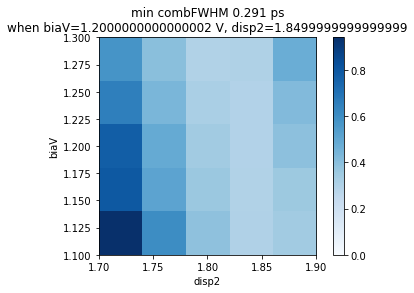

In [27]:
import matplotlib.pyplot as plt
result_mean = np.mean(np.array(result),axis=2)
biaV_idx, disp2_idx = np.unravel_index(np.argmin(result_mean), result_mean.shape)
fig = plt.figure()
plt.imshow(result_mean, cmap='Blues',vmin=0,extent=[disp2_list.min(),disp2_list.max(),biaV_list.min(),biaV_list.max()])
plt.xlabel("disp2")
plt.ylabel("biaV")
plt.title(f"min combFWHM {result_mean[biaV_idx, disp2_idx]:.3f} ps\n"+
         f"when biaV={biaV_list[biaV_idx]} V, disp2={disp2_list[disp2_idx]}")
plt.colorbar()
# fig.show()
fig.savefig(filedir+'results.png')

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
Instek GPD-4303S DCSupply: VSET channel 1 set to 0.800V


Z:\Maodong\Projects\Keck\Keck Comb\LFC\Hardware\TDS2024C.py:165: UserWarning: TDS2024C OSC: Directory Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2 does not exist. Creating new directory.
  warnings.warn(self.devicename+": Directory "+filedir+" does not exist. Creating new directory.")


TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.80_pwr_3.69_A_1.mat


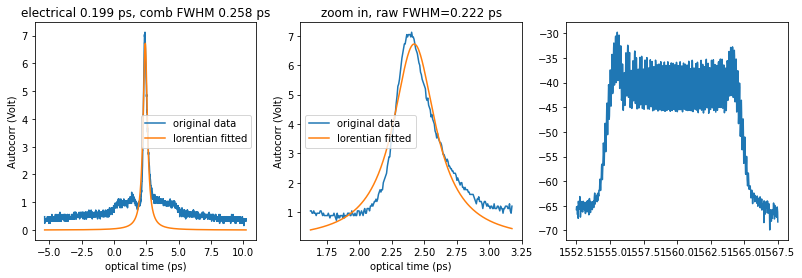

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.80_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

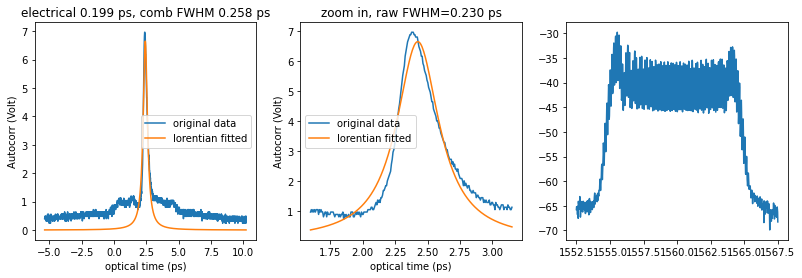

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.80_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

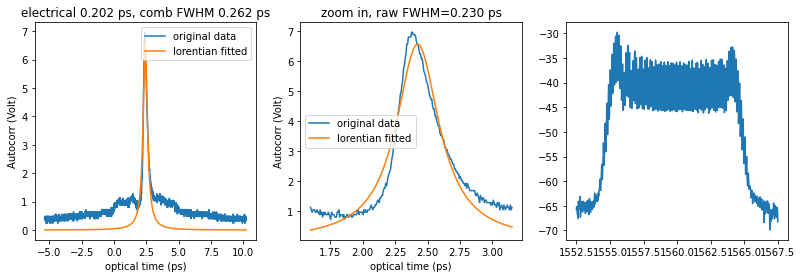

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.850V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.85_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

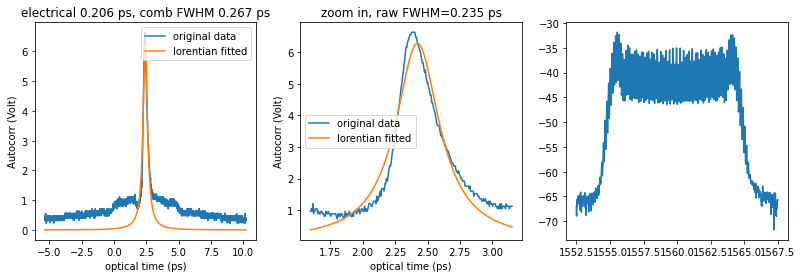

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.85_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

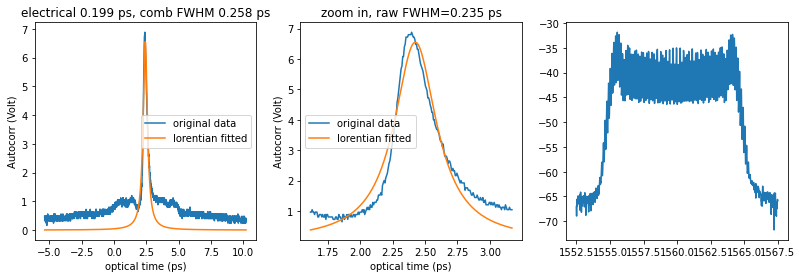

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.85_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

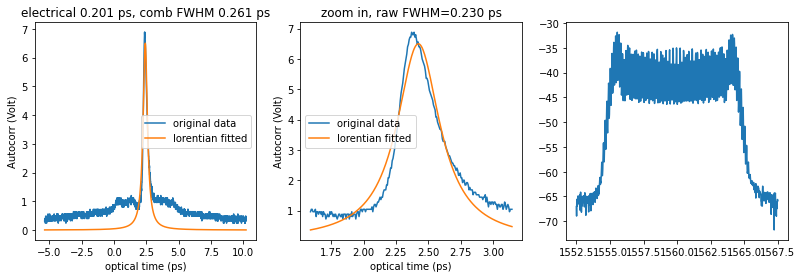

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.900V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.90_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

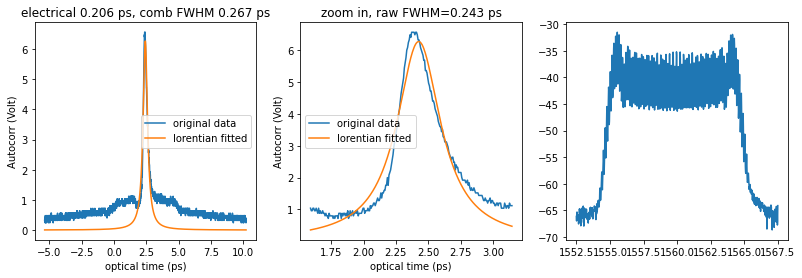

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.90_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

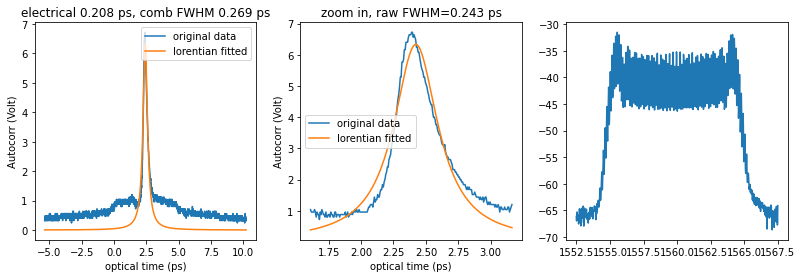

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.90_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

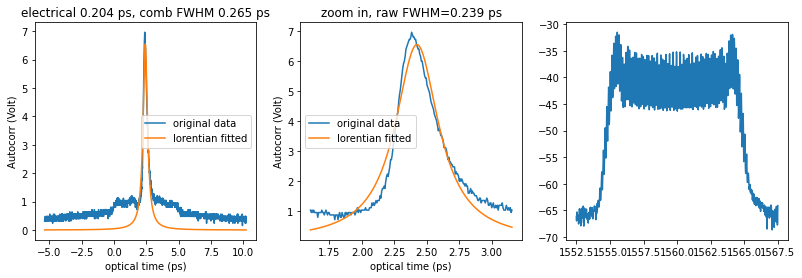

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.950V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.95_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

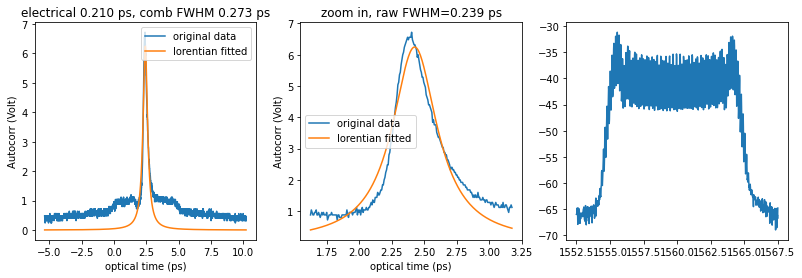

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.95_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

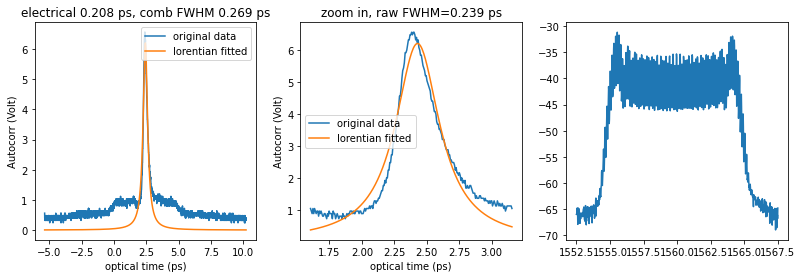

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_0.95_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

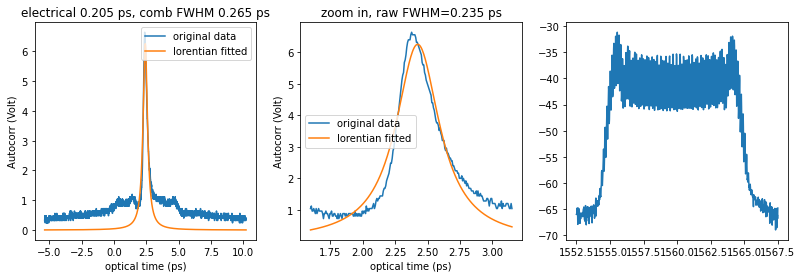

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.000V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_1.00_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

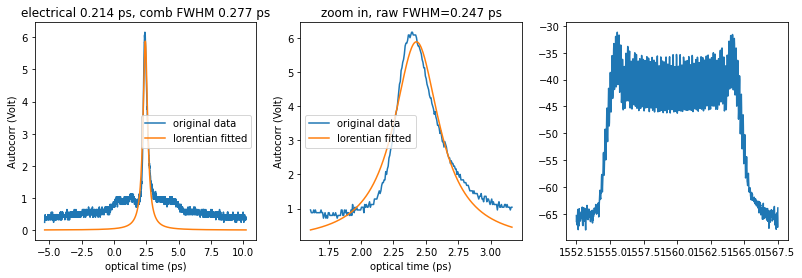

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_1.00_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

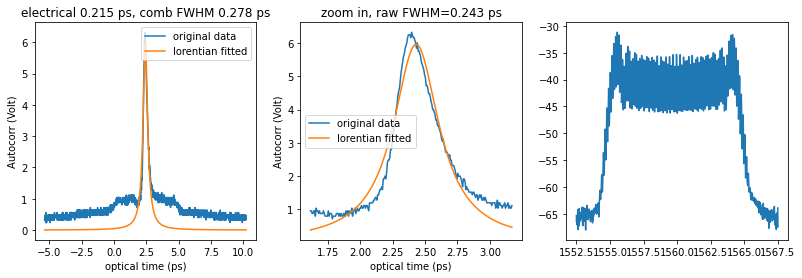

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.90_biaV_1.00_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

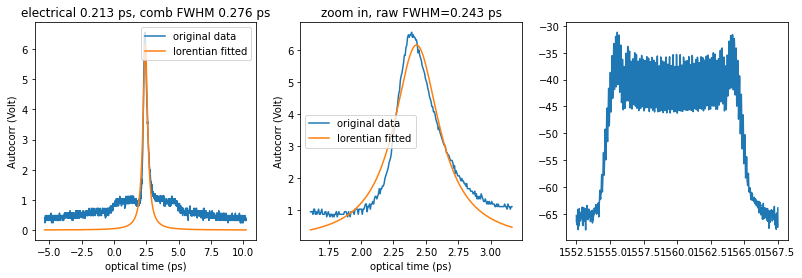

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
Instek GPD-4303S DCSupply: VSET channel 1 set to 0.800V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.80_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

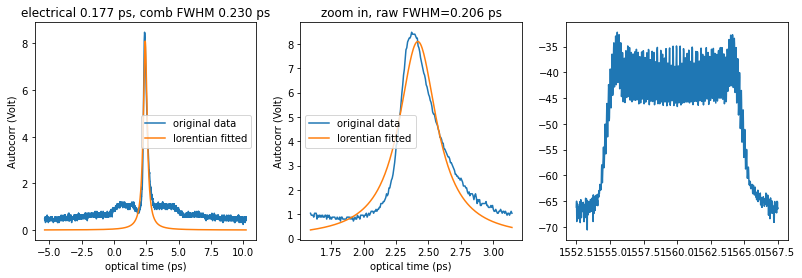

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.80_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

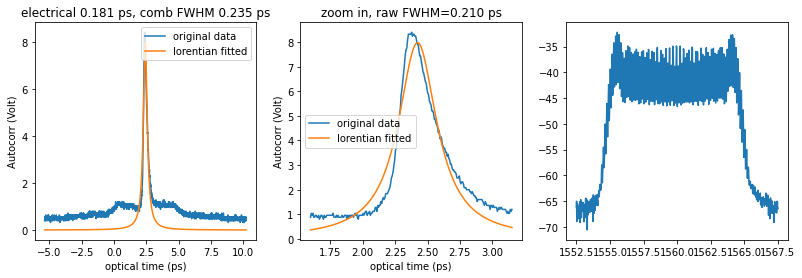

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.80_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

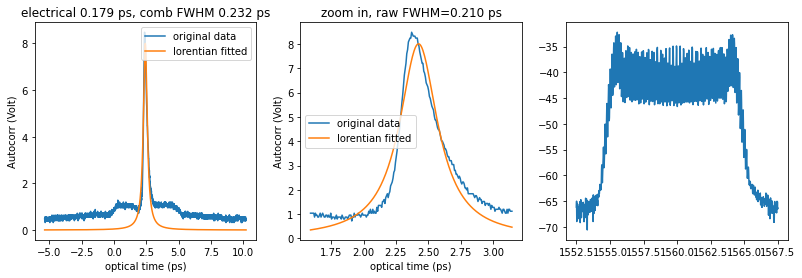

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.850V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.85_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

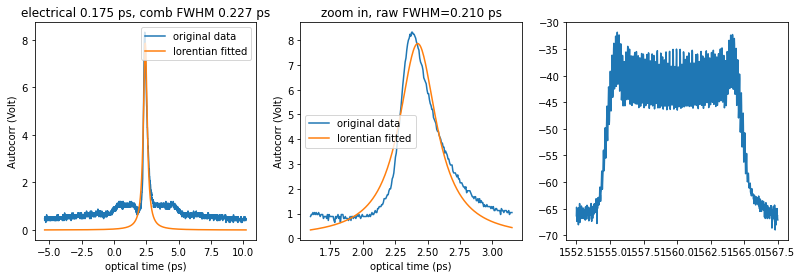

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.85_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

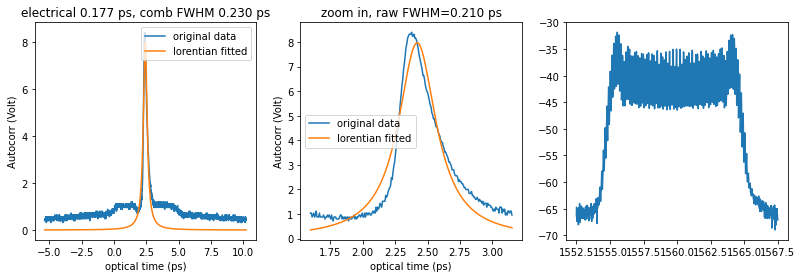

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.85_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

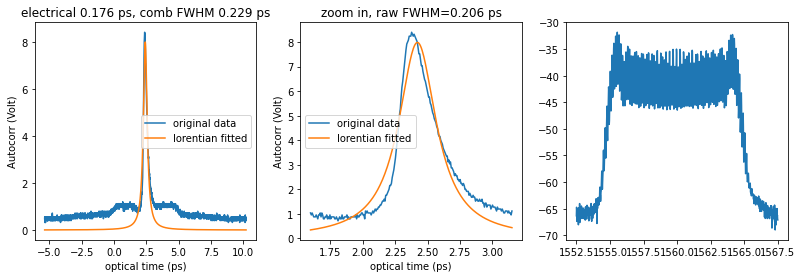

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.900V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.90_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

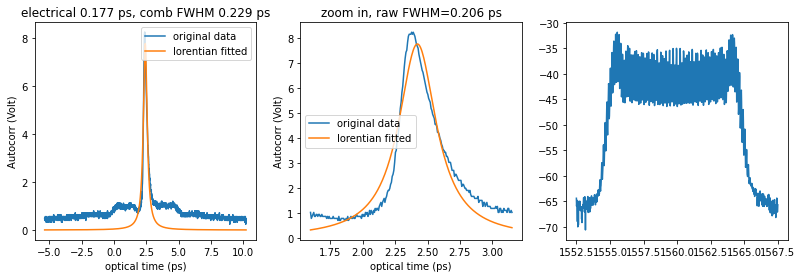

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.90_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

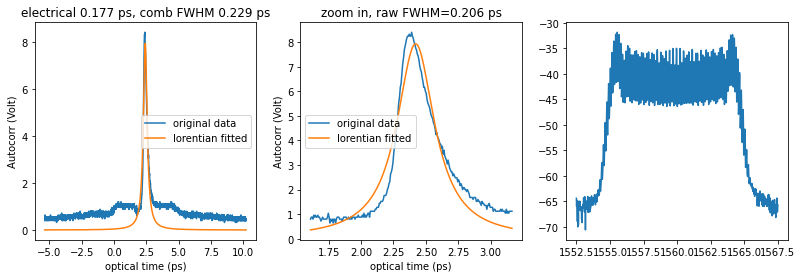

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.90_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

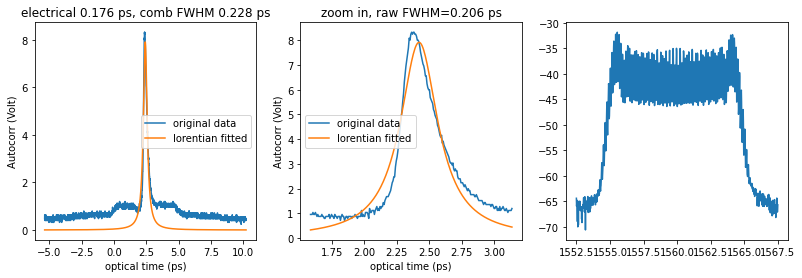

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.950V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.95_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

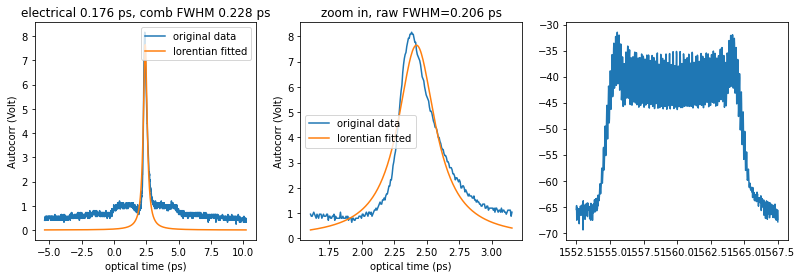

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.95_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

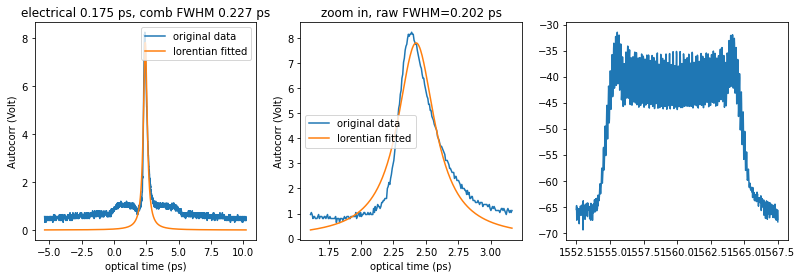

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_0.95_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

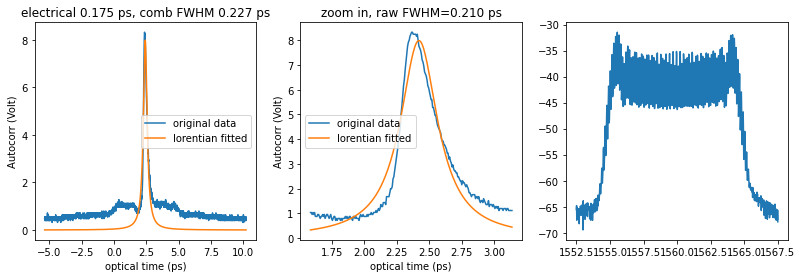

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.000V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_1.00_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

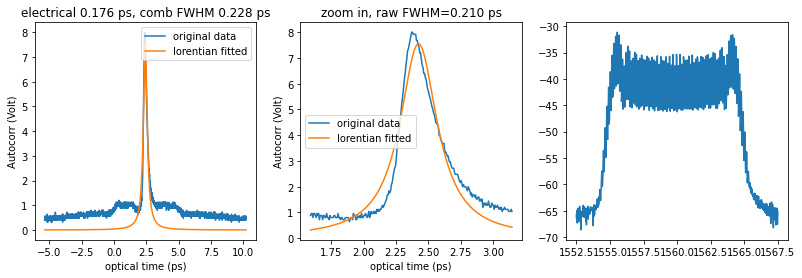

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_1.00_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

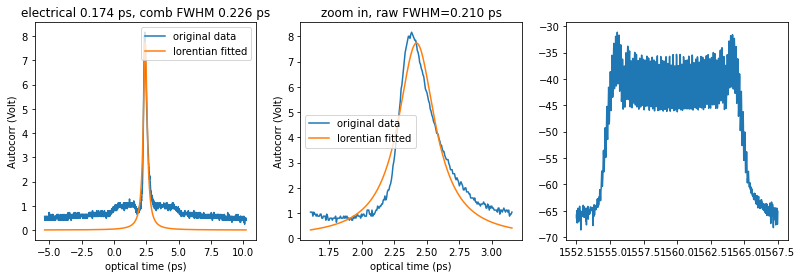

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_1.95_biaV_1.00_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

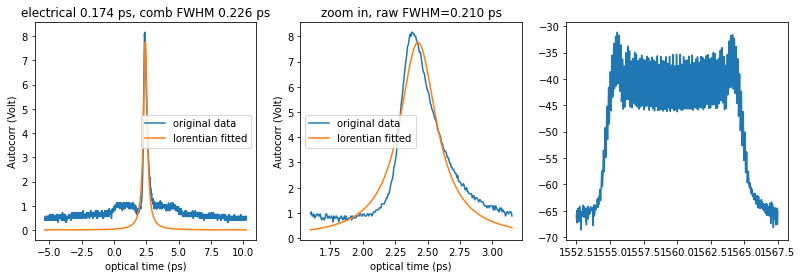

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
Instek GPD-4303S DCSupply: VSET channel 1 set to 0.800V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.80_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

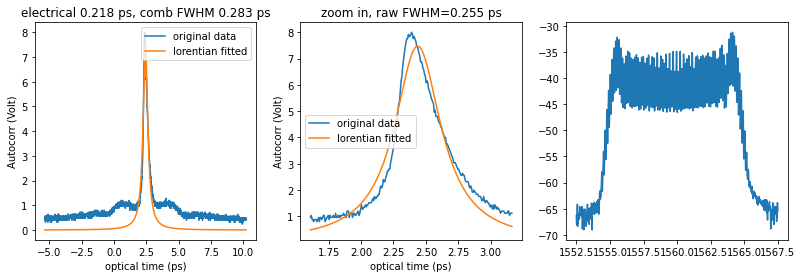

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.80_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

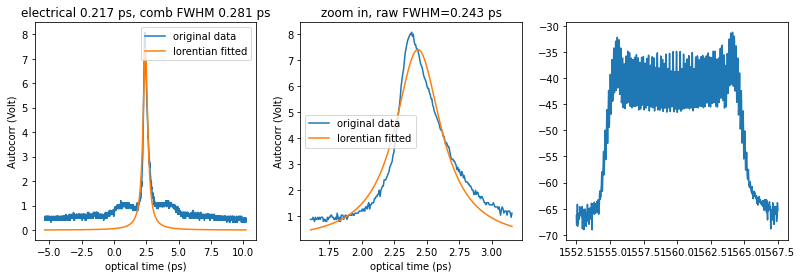

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.80_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

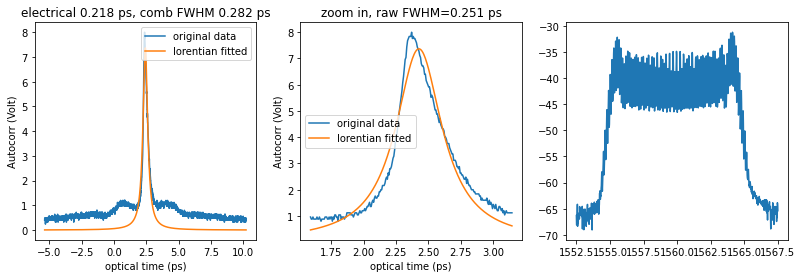

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.850V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.85_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

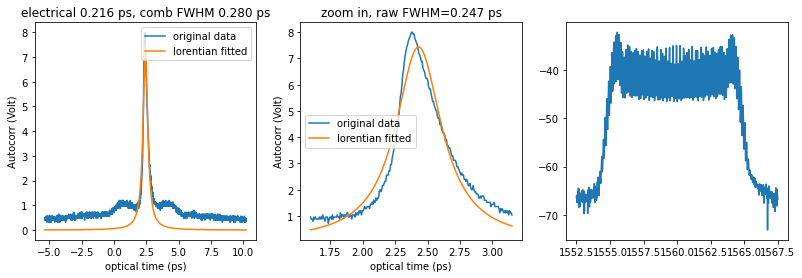

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.85_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

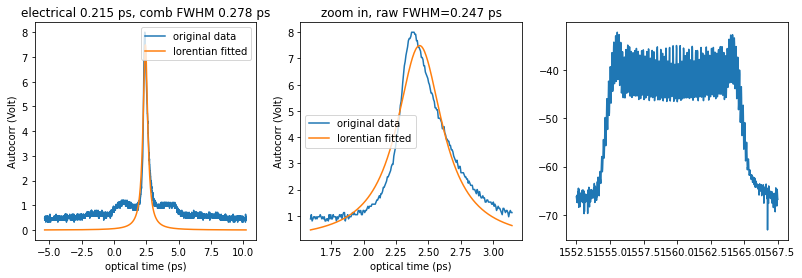

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.85_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

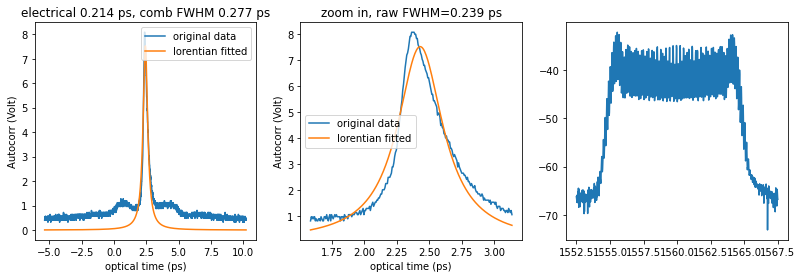

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.900V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.90_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

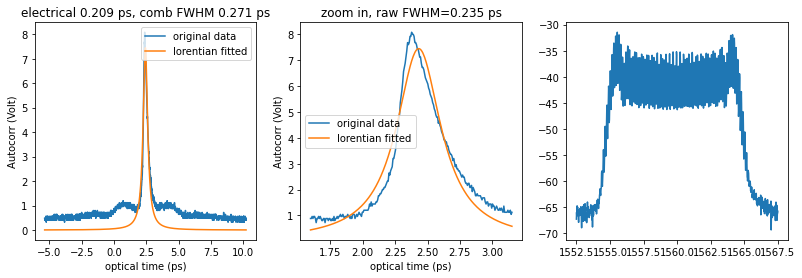

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.90_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

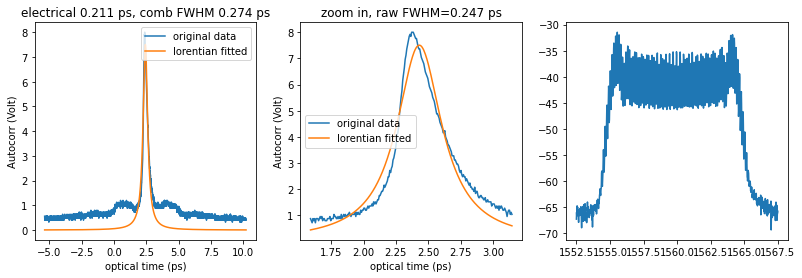

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.90_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

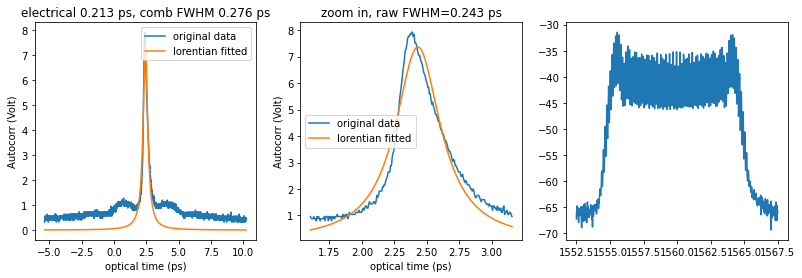

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.950V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.95_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

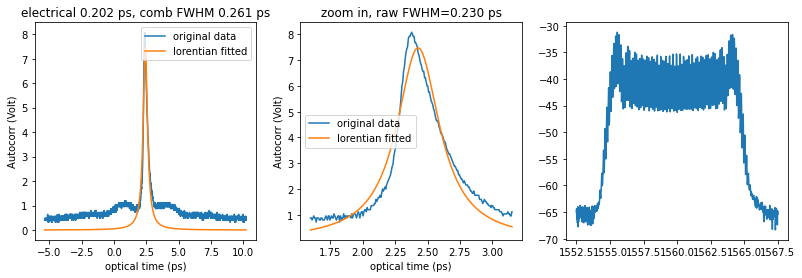

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.95_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

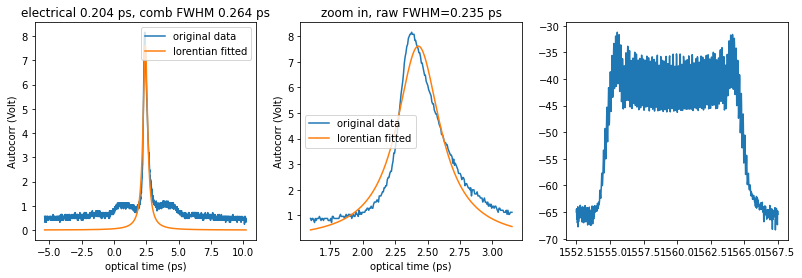

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_0.95_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

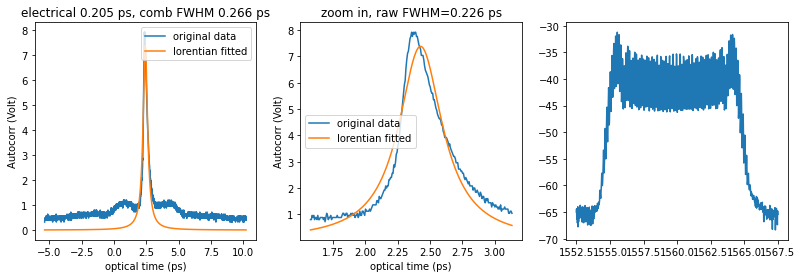

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.000V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_1.00_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

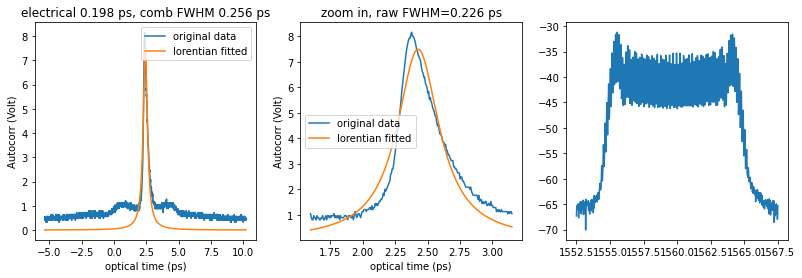

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_1.00_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

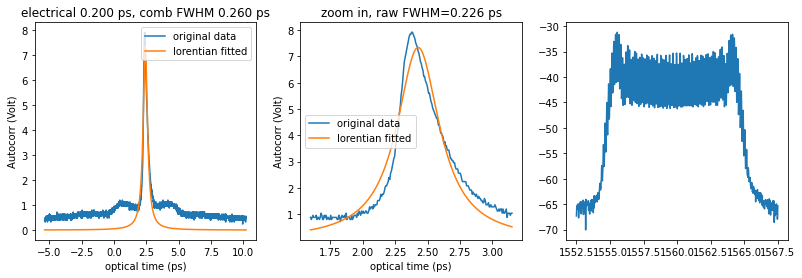

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.00_biaV_1.00_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

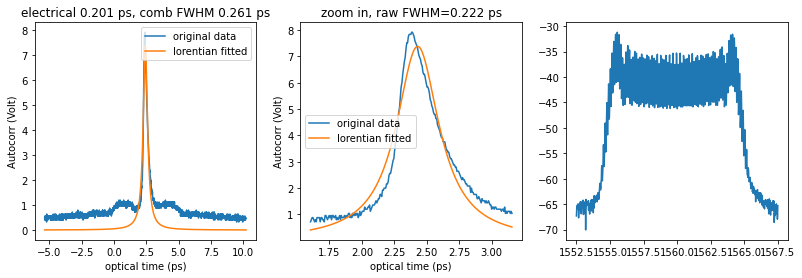

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
Instek GPD-4303S DCSupply: VSET channel 1 set to 0.800V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.80_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

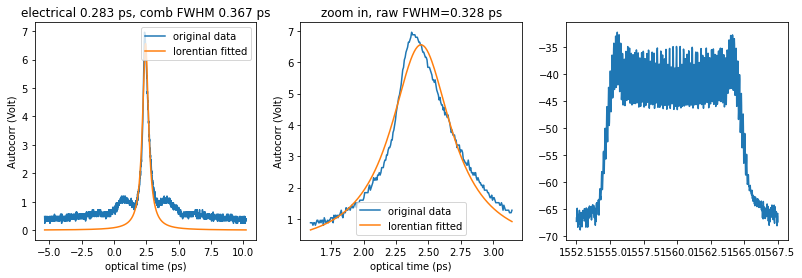

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.80_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

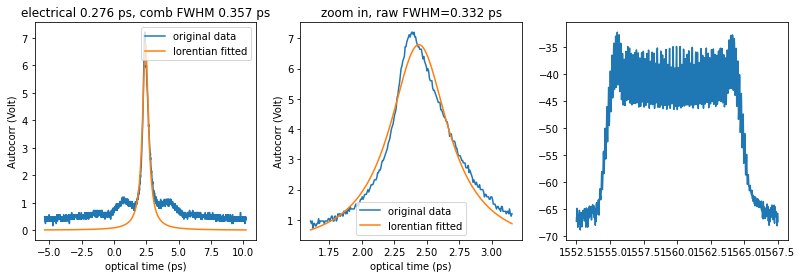

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.80_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

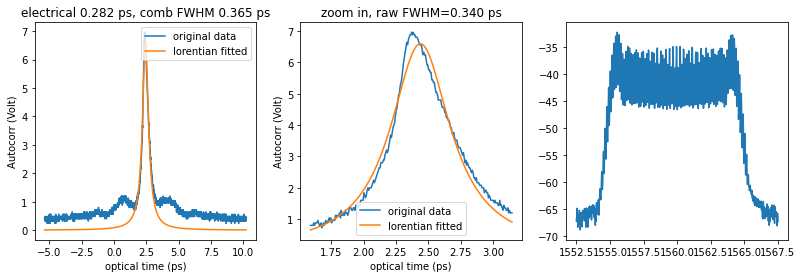

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.850V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.85_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

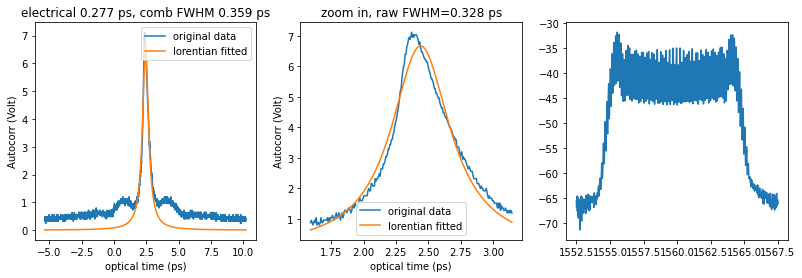

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.85_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

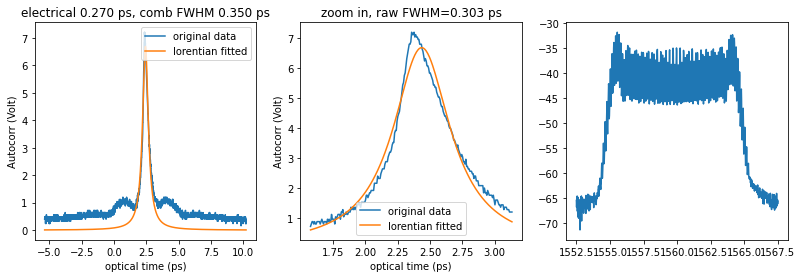

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.85_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

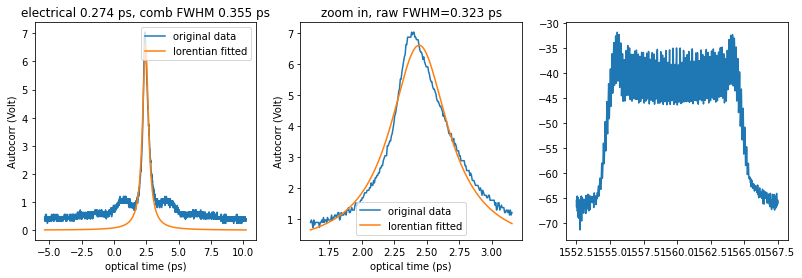

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.900V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.90_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

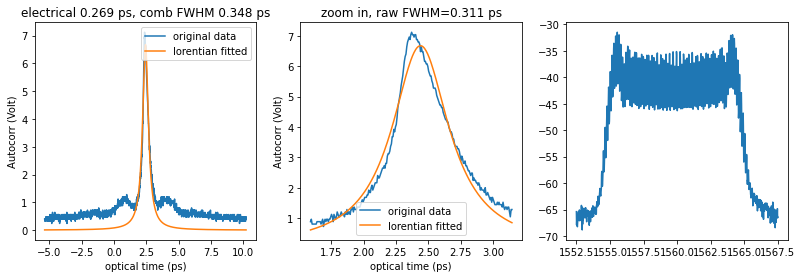

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.90_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

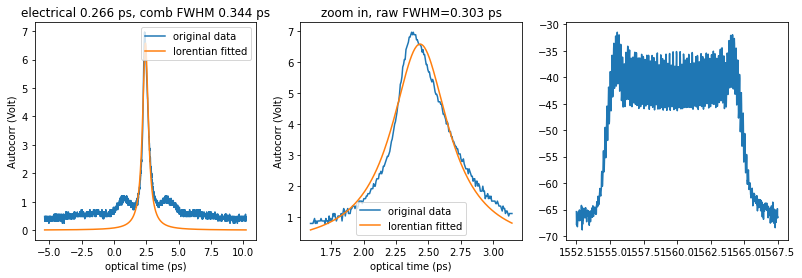

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.90_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

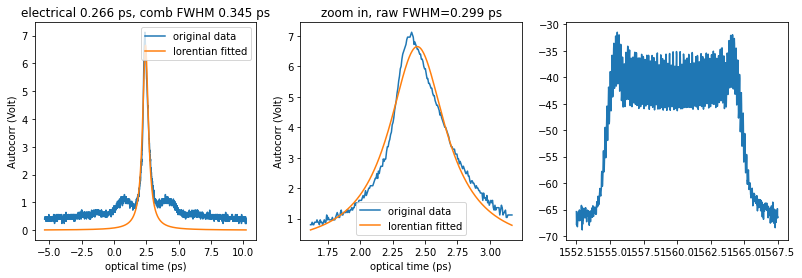

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.950V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.95_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

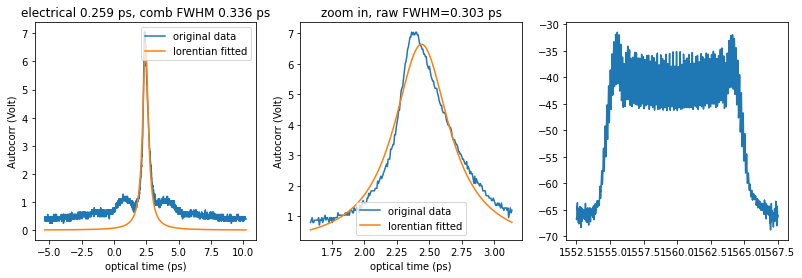

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.95_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

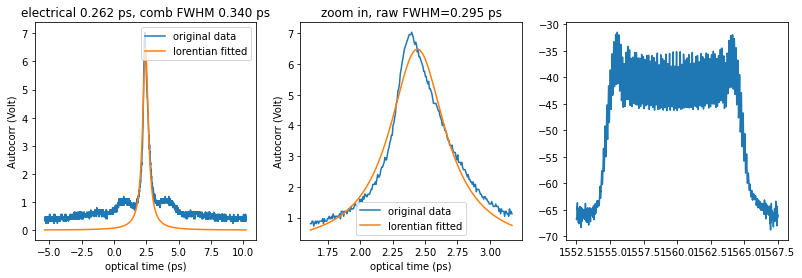

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_0.95_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

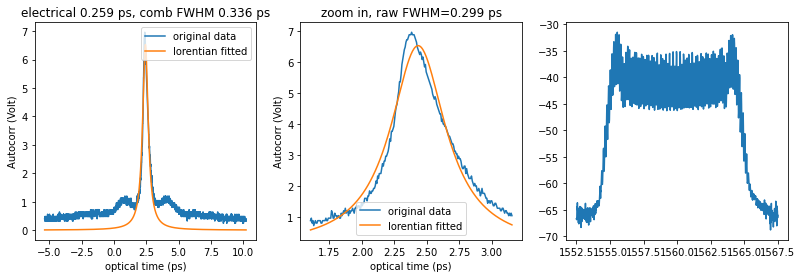

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.000V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_1.00_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

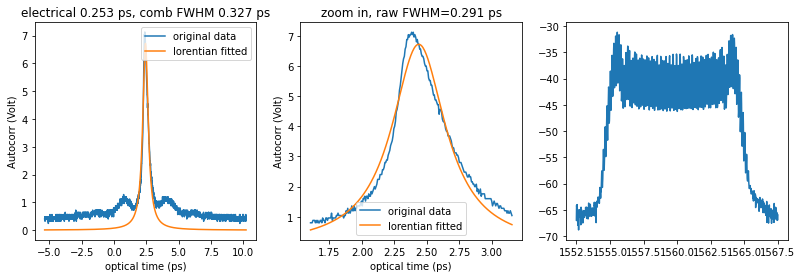

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_1.00_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

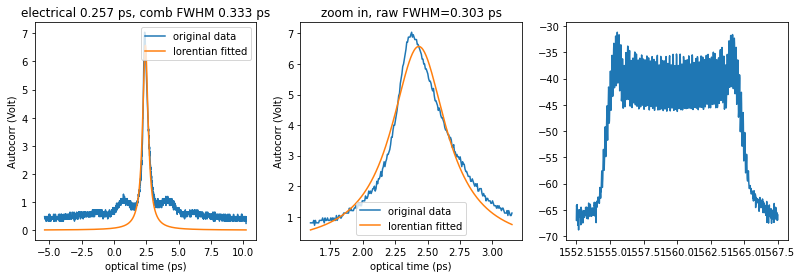

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.05_biaV_1.00_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

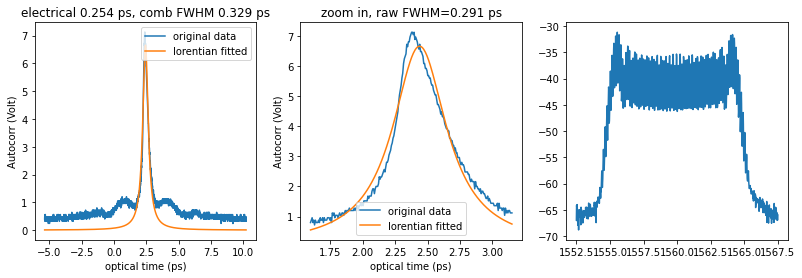

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.
Instek GPD-4303S DCSupply: VSET channel 1 set to 0.800V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.80_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

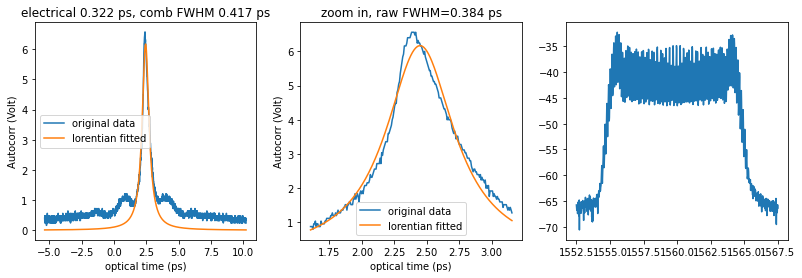

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.80_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

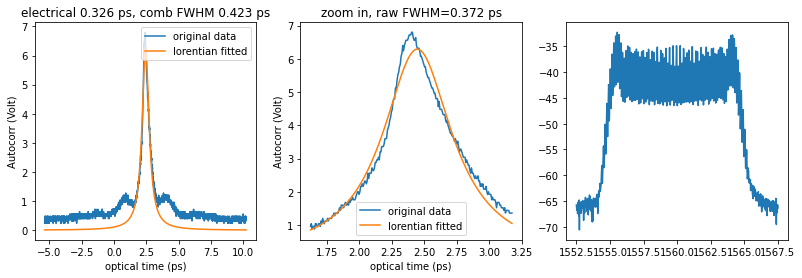

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.80_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

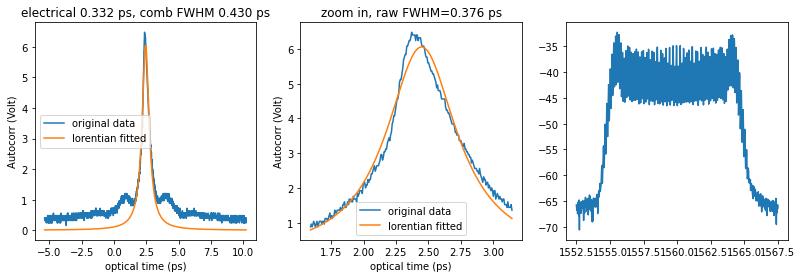

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.850V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.85_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

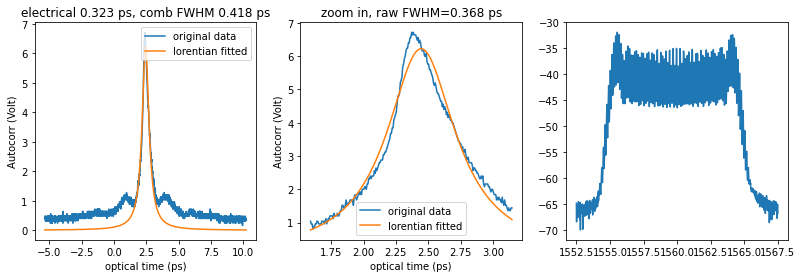

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.85_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

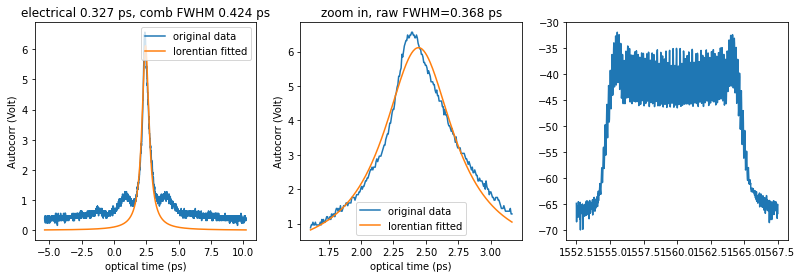

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.85_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

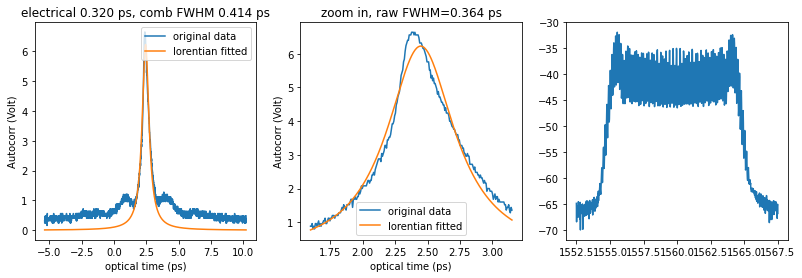

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.900V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.90_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

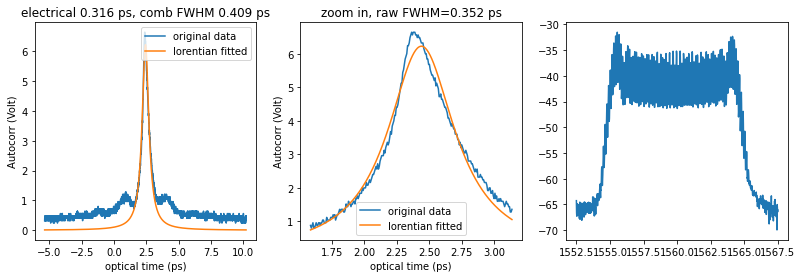

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.90_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

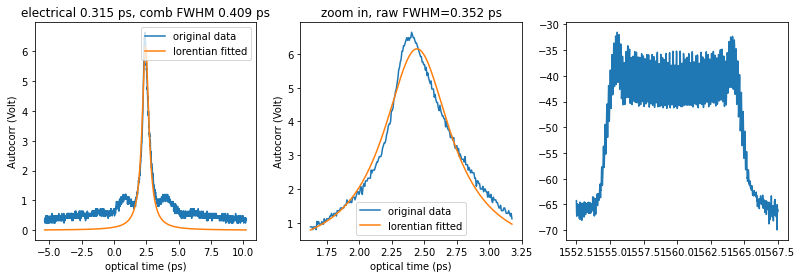

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.90_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

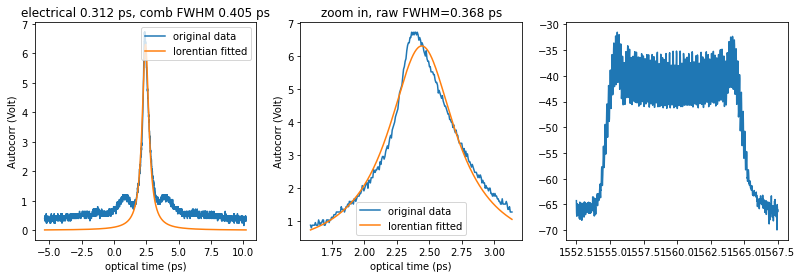

Instek GPD-4303S DCSupply: VSET channel 1 set to 0.950V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.95_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

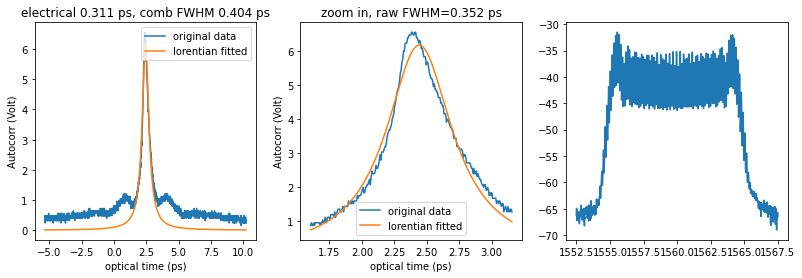

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.95_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

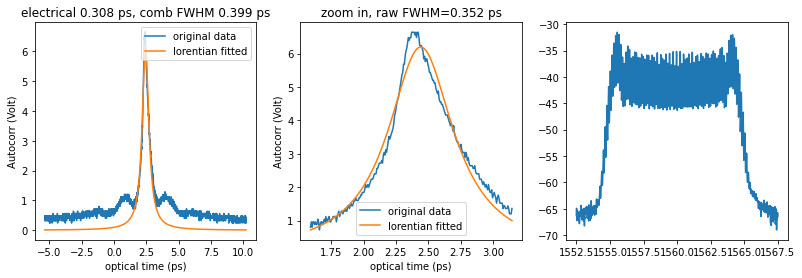

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_0.95_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

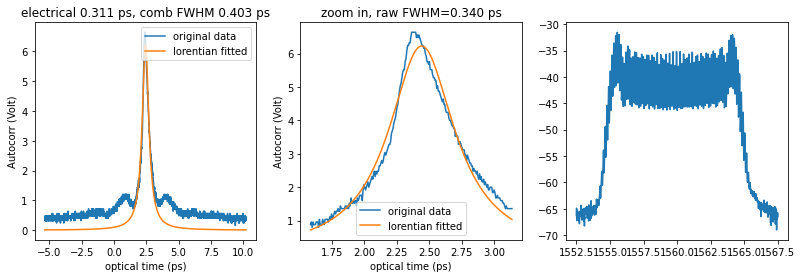

Instek GPD-4303S DCSupply: VSET channel 1 set to 1.000V
TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_1.00_pwr_3.69_A_1.mat


<Figure size 432x288 with 0 Axes>

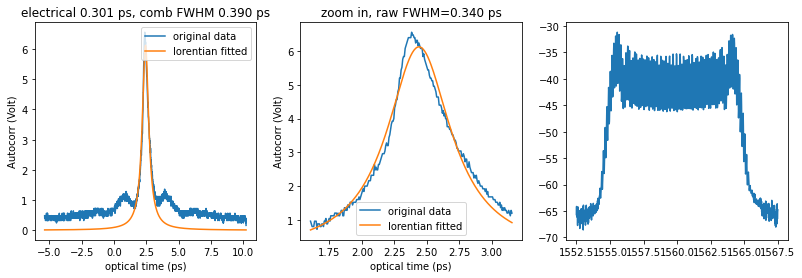

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_1.00_pwr_3.69_A_2.mat


<Figure size 432x288 with 0 Axes>

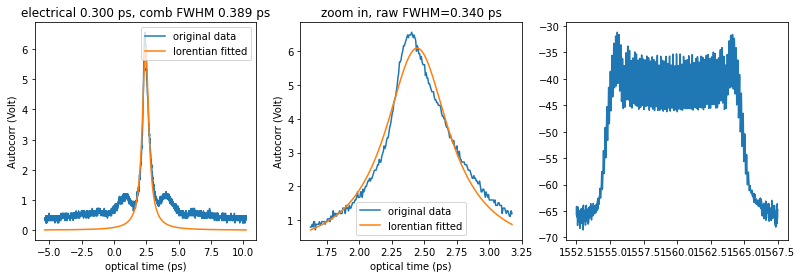

TDS2024C OSC: Trace 2 data read finished.
TDS2024C OSC: Trace 2 data is saved to Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\disp2_2.10_biaV_1.00_pwr_3.69_A_3.mat


<Figure size 432x288 with 0 Axes>

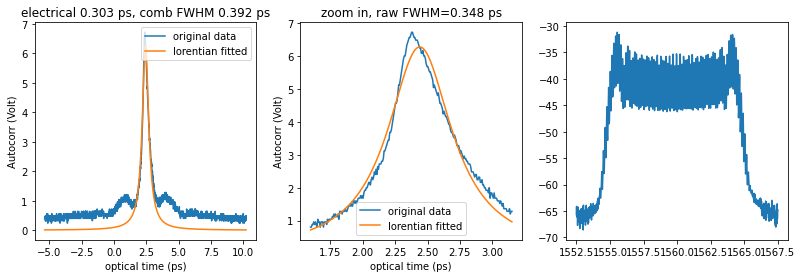

<Figure size 432x288 with 0 Axes>

In [6]:
import numpy as np
import matplotlib.pyplot as plt
filedir = r"Z:\Maodong\Projects\Keck\Compression Stage test\20221009\NIST20cm_2\\"

result = []
biaV_list = np.linspace(0.8,1,5)
disp2_list= np.linspace(1.9,2.1,5)
for jj, disp2 in enumerate(disp2_list):
    lfc.wsp.set3rdDisper(d2=disp2, d3= -0.0, preview_plot=0)
    lfc.wsp.setBandPass(span=5)# ws.plotStatus()
    lfc.wsp.writeProfile()

    FWHM_list = []
    for ii,biaV in enumerate(biaV_list):
        lfc.RFoscPS.Vset1 = biaV
        
        pw_list = []
        
        filename = f"disp2_{disp2:.2f}_biaV_{biaV:.2f}_pwr_{lfc.ptamp.pwrAmp/1000:.2f}_A"
        spec = osa.get_trace('c', plot=False)
        for kk in range(3):
            pw,_, fig = osc.get_autocorr_FWHM_single(filename=filedir+filename+f"_{kk+1:.0f}.mat",
                            fit_range=250,
                            additional_plotdata=spec)
            pw_list.append(pw)
            plt.draw()
        FWHM_list.append(pw_list)
    result.append(FWHM_list)
    
to_save = {'result':result, 'biaV_list':biaV_list, 'disp2_list':disp2_list}
from scipy.io import savemat
savemat(filedir+'results.mat', to_save)

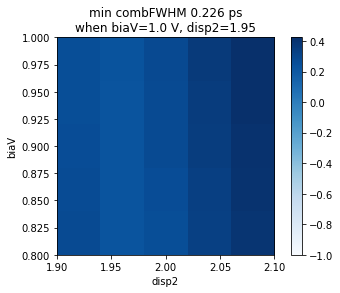

In [7]:
import matplotlib.pyplot as plt
result_mean = np.mean(np.array(result),axis=2).T
biaV_idx, disp2_idx = np.unravel_index(np.argmin(result_mean), result_mean.shape)
fig = plt.figure()
plt.imshow(result_mean, cmap='Blues',vmin=-1,extent=[disp2_list.min(),disp2_list.max(),biaV_list.min(),biaV_list.max()])
plt.xlabel("disp2")
plt.ylabel("biaV")
plt.title(f"min combFWHM {result_mean[biaV_idx, disp2_idx]:.3f} ps\n"+
         f"when biaV={biaV_list[biaV_idx]} V, disp2={disp2_list[disp2_idx]}")
plt.colorbar()
# fig.show()
fig.savefig(filedir+'results.png')

In [80]:
lfc.wsp.set3rdDisper(d2=2.2, d3= -0.0, preview_plot=0)
lfc.wsp.setBandPass(span=5)# ws.plotStatus()
lfc.wsp.writeProfile()
# lfc.RFoscPS.Vout1 = 0.8

Waveshaper Set atten to BandPass [189.675~194.675] THz ([1580.559~1539.964] nm).
Waveshaper profile write successful.


Z:\Maodong\Projects\Keck\Keck Comb\LFC\Hardware\TDS2024C.py:170: UserWarning: TDS2024C OSC: To save Filename Z:\Maodong\Projects\Keck\Compression Stage test\20221008\disp2_2.2_biaV_0.9.mat already exists. Previous file renamed.
  warnings.warn(self.devicename+": To save Filename "+filename+ext+" already exists. Previous file renamed.")


TDS2024C OSC: Trace 2 data read finished.


Z:\Maodong\Projects\Keck\Keck Comb\LFC\Hardware\TDS2024C.py:188: UserWarning: TDS2024C OSC: Save trace to Z:\Maodong\Projects\Keck\Compression Stage test\20221008\disp2_2.2_biaV_0.9.mat failed.
  warnings.warn(self.devicename+": Save trace to "+filename+".mat failed.")


Error:<class 'TypeError'>


(0.32793429271586433,
 array([0.00500614, 0.00501421, 0.0050223 , ..., 0.00487617, 0.00486843,
        0.00486071]))

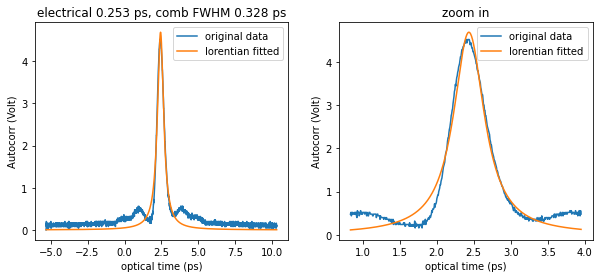

In [2]:
osc.get_autocorr_FWHM_single(filename=r"Z:\Maodong\Projects\Keck\Compression Stage test\20221008\disp2_2.2_biaV_0.9.mat", 
                             fit_range=500)

In [38]:
lfc.ptamp.pwrAmp = 0
lfc.ptamp.preAmp = 0
lfc.ptamp.activation = 0
lfc.amamp2.activation = 0
lfc.amamp2.accCh1Status = 0
lfc.amamp.activation = 0
lfc.amamp.accCh2Status = 0
lfc.amamp.accCh1Status = 0

lfc.RFampPS.activation1 = 0
lfc.RFoscPS.activation = 0

Z:\Maodong\Projects\Keck\Keck Comb\LFC\Hardware\PritelAmp.py:137: UserWarning: Pritel 3.85A 3.6W FA: Setting pwrAmp when activation is OFF is not effective! Run self.activation=1 before setting pwrAmp.
  warnings.warn(self.devicename+": Setting pwrAmp when activation is OFF is not effective! Run self.activation=1 before setting pwrAmp.")


Pritel 3.85A 3.6W FA: Disable Ramping by self.ramp_pwr_ma = 0, now 100 mA.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 0.00 A, , current Output 0.00 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 0.00 A, , current Output 0.00 W.
Pritel 3.85A 3.6W FA: Disable Ramping by self.ramp_pre_ma = 0, now 100 mA.
Pritel 3.85A 3.6W FA: Setting PreAmp Current to 000 mA, current Output 0.00 W.
Pritel 3.85A 3.6W FA: Setting PreAmp Current to 000 mA, current Output 0.00 W.
Pritel 3.85A 3.6W FA: setted Activation status as OFF, finished in 0.514 seconds
Amonic 13dbm EDFA: setted Activation status as OFF, finished in 0.040 seconds
Amonic 13dbm EDFA: setted ACC CH1 status as OFF, finished in 0.030 seconds
Amonic 23dbm EDFA: setted Activation status as OFF, finished in 0.060 seconds
Amonic 23dbm EDFA: setted ACC CH2 status as OFF, finished in 0.050 seconds
Amonic 23dbm EDFA: setted ACC CH1 status as OFF, finished in 0.030 seconds
RF amplifier Power Supply 30V 4.5A: channel 1 output is turned O

In [40]:
lfc.amamp.accCh1Status = 1
lfc.amamp.accCh2Status = 1
lfc.amamp.activation = 1

lfc.RFoscPS.activation = 1
import time
time.sleep(10)
lfc.RFampPS.activation1 = 1


# lfc.amamp2.accCh1Status = 1
# lfc.amamp2.activation = 1


Amonic 23dbm EDFA: setted ACC CH1 status as ON, finished in 0.040 seconds
Amonic 23dbm EDFA: setted ACC CH2 status as ON, finished in 0.030 seconds
Amonic 23dbm EDFA: ACTIVATING LASER OUTPUT, MAKE SURE SEED INPUT POWER IS APPROPRIATE TO AVOID DAMAGE
Amonic 23dbm EDFA: setted Activation status as ON, finished in 0.040 seconds
Instek GPD-4303S DCSupply: Output activation is turned ON.
RF amplifier Power Supply 30V 4.5A: channel 1 output is turned ON


In [30]:
lfc.RFoscPS.activation = 1
import time
time.sleep(10)
lfc.RFampPS.activation1 = 1

Instek GPD-4303S DCSupply: Output activation is turned ON.
RF amplifier Power Supply 30V 4.5A: channel 1 output is turned ON


In [87]:
# lfc.ptamp.activation = 1
lfc.ptamp.ramp_pwr_ma=100
lfc.ptamp.preAmp = '600mA'
lfc.ptamp.pwrAmp = '3.8A'

Pritel 3.85A 3.6W FA: Disable Ramping by self.ramp_pre_ma = 0, now 100 mA.
Pritel 3.85A 3.6W FA: Setting PreAmp Current to 600 mA, current Output 3.36 W.
Pritel 3.85A 3.6W FA: Setting PreAmp Current to 600 mA, current Output 3.35 W.
Pritel 3.85A 3.6W FA: Disable Ramping by self.ramp_pwr_ma = 0, now 100 mA.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.49 A, , current Output 3.35 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.59 A, , current Output 3.43 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.70 A, , current Output 3.54 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.80 A, , current Output 3.56 W.


In [28]:
lfc.ptamp.ramp_pwr_ma=100
lfc.ptamp.pwrAmp = 0
lfc.ptamp.preAmp = 0
lfc.ptamp.activation=0

Pritel 3.85A 3.6W FA: Disable Ramping by self.ramp_pwr_ma = 0, now 100 mA.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.69 A, , current Output 3.58 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.59 A, , current Output 3.47 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.48 A, , current Output 3.35 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.38 A, , current Output 3.22 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.28 A, , current Output 3.17 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.18 A, , current Output 2.99 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 3.08 A, , current Output 2.87 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 2.97 A, , current Output 2.74 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 2.87 A, , current Output 2.70 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 2.77 A, , current Output 2.50 W.
Pritel 3.85A 3.6W FA: Setting PowerAmp Current to 2.66 A, , current Output 2.39 W.
Pritel 3.85A

In [42]:
from LFC.Hardware.SRS_SIM900 import SRS_SIM900, SRS_PIDcontrol_SIM960, SRS_VoltSorc_SIM928

srs = SRS_SIM900(addr='ASRL21::INSTR')
srs.connect()
servo1 = SRS_PIDcontrol_SIM960(srs,1,name="SIM960 1st")
servo2 = SRS_PIDcontrol_SIM960(srs,3,name="FC locking PID controller")
servo3 = SRS_PIDcontrol_SIM960(srs,5,name="SIM960 3rd")

# servo3.printStatus()

# servo1.manual_output=2
# servo1.output_mode=1

Stanford Research System SIM900 connected


In [43]:
servo2.printStatus()

----------------------------FC locking PID controller----------------------------
|--------------------SRS PID controller SIM960 Status Summary--------------------
|----------------------------SIM960,s/n033669,ver2.17----------------------------
|	Output mode:	MAN,	Output limit: -3.000V TO 3.000V
|	Measured input:	 0.187553V
|	Amplified error:	 1.191043V
|	Instant Output voltage:	 0.056887V
|	Manual output set:	 0.06V
|	================ Set Point related================
|		Internal setpoint = 0.307 V, Ramping OFF
|		Setpoint input mode INT, Ext setpoint input 0.306822V
|		Setpoint RAMP speed = 0.01 V/s, action OFF
|	============= P,I,D and Offset Status=============
|		 P = 10.0    , 	action = ON
|		 I = 0.1 1/s, 	action = OFF
|		 D = 1e-05   s, 	action = OFF
|		Off = 1.2  V, 	action = ON
-----------------SRS PID controller SIM960 Status Summary Ends------------------



'----------------------------FC locking PID controller----------------------------\n|--------------------SRS PID controller SIM960 Status Summary--------------------\n|----------------------------SIM960,s/n033669,ver2.17----------------------------\n|\tOutput mode:\t\x1bMAN\x1b,\tOutput limit: -3.000V TO 3.000V\n|\tMeasured input:\t 0.187553V\n|\tAmplified error:\t 1.191043V\n|\tInstant Output voltage:\t 0.056887V\n|\tManual output set:\t 0.06V\n|\t================ Set Point related================\n|\t\tInternal setpoint = 0.307 V, Ramping \x1bOFF\x1b\n|\t\tSetpoint input mode INT, Ext setpoint input 0.306822V\n|\t\tSetpoint RAMP speed = 0.01 V/s, action \x1bOFF\x1b\n|\t============= P,I,D and Offset Status=============\n|\t\t P = 10.0    , \taction = \x1bON\x1b\n|\t\t I = 0.1 1/s, \taction = \x1bOFF\x1b\n|\t\t D = 1e-05   s, \taction = \x1bOFF\x1b\n|\t\tOff = 1.2  V, \taction = \x1bON\x1b\n-----------------SRS PID controller SIM960 Status Summary Ends------------------\n'

FC locking PID controller: PID output is turned OFF, output mode is turnd to Manual.


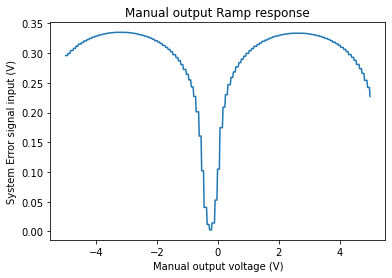

In [46]:
# servo2.printStatus()
voltage_list = np.linspace(-5,5,500)
r = servo2.manual_sweep(voltage_list, start_pause=0.5, interval_pause=0.1)

In [52]:
voltage_list[250:][np.argmax(r[250:])]

2.5751503006012024

In [61]:
np.max(r[250:])/2

0.166765

In [58]:
voltage_list[250:][np.where(r[250:]-np.max(r[250:])/2<0.01)]

array([0.01002004, 0.03006012, 0.0501002 , 0.07014028, 0.09018036,
       0.11022044, 0.13026052, 0.1503006 ])

In [69]:
idx=253
print(r[idx])
print(voltage_list[idx])

0.17445
0.0701402805611222


In [79]:
servo2.manual_output = 0.615
import time
time.sleep(2)
servo2.measure_input

FC locking PID controller: Manual output voltage Ramping. Disable this by set self.manual_output_ramp=0. 
Output in Manual Mode in Volt set to 0.615.
Output in Manual Mode in Volt set to 0.615.


0.283523

In [45]:
servo2.manual_output_ramp=0.1
servo2.manual_output = 0

FC locking PID controller: Manual output voltage Ramping. Disable this by set self.manual_output_ramp=0. 
Output in Manual Mode in Volt set to 0.390.
Output in Manual Mode in Volt set to 0.260.
Output in Manual Mode in Volt set to 0.130.
Output in Manual Mode in Volt set to 0.000.


In [89]:
servo2.measure_input

0.290576

In [91]:
servo2.setpoint=0.291

FC locking PID controller: Setting Locking set point in Volt to 0.291.


In [93]:
servo2.outoffset = 0.722

FC locking PID controller: Setting Output offset in Volts to 0.722.


In [94]:
servo2.output_mode = 1

FC locking PID controller: output mode 1 is understood as PID mode.
FC locking PID controller: PID output is turned ON.


In [99]:
servo2.prop_gain = 25

FC locking PID controller: Setting Proportional Gain in V/V to 25.0.
